# **0. Importing libraries**

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=55c06b4edcc089a85c3d14d70c66a0311b3068eb907c7278370c98563c3349c7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 9.0 MB/s eta 0:00:00


In [ ]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Data visualisation libraries
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

# Machine learning libraries
import imblearn
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_validate, StratifiedKFold, train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, precision_recall_curve, auc, average_precision_score, make_scorer, f1_score, recall_score, precision_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import KNNImputer
from xgboost import XGBClassifier

import joblib

# Explaners
import lime
import lime.lime_tabular
import shap

# Statistics
from scipy import stats

import time

# Turn off warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/Dissertation/Dataset/'
admissions = pd.read_csv(path + 'admissions.csv')
patients = pd.read_csv(path + 'patients.csv')
labevents = pd.read_csv(path + 'labevents.csv')
vital_signs = pd.read_csv(path + 'vital_signs.csv')
neuro_checks = pd.read_csv(path + 'neurological_checks.csv', low_memory=False)
symptoms = pd.read_csv(path + 'neurological_symptoms.csv', low_memory=False)
diagnoses_icd = pd.read_csv(path + 'diagnoses_icd.csv')
care_unit = pd.read_csv(path + 'care_unit.csv')

# **1. Data Preparation**

## **1.1. ICD Diagnosis**

In [ ]:
pip install icd-mappings

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 11.7 MB/s eta 0:00:00
  Attempting uninstall: importlib-resources
    Found existing installation: importlib_resources 6.4.5
    Uninstalling importlib_resources-6.4.5:
      Successfully uninstalled importlib_resources-6.4.5


In [ ]:
from icdmappings import Mapper
mapper = Mapper()

diagnoses_icd['icd_10'] = diagnoses_icd['icd_code'].apply(lambda x: x if mapper.map(x, source='icd9', target='icd10') == None
                                                         else mapper.map(x, source='icd9', target='icd10'))

# Remove records that have the same icd_10
diagnoses_icd.drop_duplicates(subset=['subject_id', 'hadm_id', 'icd_10'], inplace=True)
diagnoses_icd.drop('icd_10', axis=1, inplace=True)

In [ ]:
# target
ischemic = ['I63', 'I65', 'I66']

hemorrhagic = ['I60', 'I61']
target = ischemic + hemorrhagic

# substances use
alcohol = ['F10']
cocaine = ['F14']
nicotine = ['F17']
substance_codes = alcohol + cocaine + nicotine

# family history
fam_stroke = ['Z823']
fam_diabetes = ['Z833']
family = fam_stroke + fam_diabetes

# history of head injury
injury = ['Z87820']

# comorbidity + medical history
# atheroma: diabetes + angina + intermittent claudication
diabetes = ['E10', 'E11']
angina = ['I20']
inte_claud = [f'I70{x}1' for x in range(2,6)]
atheroma = diabetes + angina + inte_claud

# cerebrovascular diseases
arter_malform = ['Q273']
moyamoya = ['I675']
amyloid_angiopathy = ['I680']
cerebrovascular_diseases = arter_malform + moyamoya + amyloid_angiopathy

# heart diseases: Infective endocarditis + Myocardial infarct + Aortic or mitral murmur + Cardiomyopathy
# + Atrial fibrillation + Cardiac failure + Cardiomegaly + Peripheral vascular disease
infective_endocarditis = ['I330']
myo_infarct = ['I21']
aortic_mitral = ['I34', 'I35']
cardiomyopathy = ['I42', 'I43']
atrial_fib = ['I48']
cardiac_fail = ['I50']
cardiomegaly = ['I517']
heart_diseases = infective_endocarditis + myo_infarct + aortic_mitral + cardiomyopathy + atrial_fib + cardiac_fail + cardiomegaly

# others
hypertension = ['I10']
tia = ['G45']
hyperlipidemia = ['E782', 'E784', 'E785']
per_vasc = ['I73']
others = hypertension + tia + hyperlipidemia + per_vasc

# -> past and present illness
past = ischemic + hemorrhagic + injury + atheroma + cerebrovascular_diseases + heart_diseases + others
present = atheroma + cerebrovascular_diseases + heart_diseases + others

### **1.1.1. Target**

In [ ]:
target_diagnoses = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith(tuple(target))]
target_diagnoses['target'] = target_diagnoses['icd_code'].apply(lambda x: 'ischemic' if x.startswith(tuple(ischemic))
                                                                else ('hemorrhagic' if x.startswith(tuple(hemorrhagic))
                                                                    else 'non-stroke'))
target_diagnoses.drop('icd_code', axis=1, inplace=True)
target_diagnoses.drop_duplicates(inplace=True)
pivot_target = target_diagnoses.pivot_table(index=['subject_id', 'hadm_id'], columns='target', aggfunc='size', fill_value=0)
pivot_target.columns = [f'{col}' for col in pivot_target.columns]
pivot_target.reset_index(inplace=True)
pivot_target['stroke'] = (pivot_target[['hemorrhagic', 'ischemic']].sum(axis=1) > 0).astype(int)

### **1.1.2. Substance use**

In [ ]:
substance_use = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith(tuple(substance_codes))]

substance_use['diagnosis'] = substance_use['icd_code'].apply(lambda x:
    ('sub_alcohol' if x.startswith(tuple(alcohol)) else
    ('sub_cocaine' if x.startswith(tuple(cocaine)) else
    ('sub_nicotine' if x.startswith(tuple(nicotine)) else np.NaN))))

substance_use.drop_duplicates(subset=['subject_id', 'hadm_id', 'diagnosis'], inplace=True)
substance_use.drop('icd_code', axis=1, inplace=True)

pivot_substance_use = substance_use.pivot_table(index=['subject_id', 'hadm_id'], columns='diagnosis', aggfunc='size', fill_value=0)
pivot_substance_use.columns = [f'{col}' for col in pivot_substance_use.columns]
pivot_substance_use.reset_index(inplace=True)

### **1.1.3. Family history**

In [ ]:
family_history = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith(tuple(family))]

family_history['diagnosis'] = family_history['icd_code'].apply(lambda x:
    ('fam_diabetes' if x.startswith(tuple(fam_diabetes)) else
    ('fam_stroke' if x.startswith(tuple(fam_stroke)) else np.NaN)))

family_history.drop_duplicates(subset=['subject_id', 'hadm_id', 'diagnosis'], inplace=True)
family_history.drop('icd_code', axis=1, inplace=True)

pivot_family_history = family_history.pivot_table(index=['subject_id', 'hadm_id'], columns='diagnosis', aggfunc='size', fill_value=0)
pivot_family_history.columns = [f'{col}' for col in pivot_family_history.columns]
pivot_family_history.reset_index(inplace=True)

### **1.1.4. Personal history**

In [ ]:
personal_history = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith(tuple(injury + past))]

admissions['admittime'] = pd.to_datetime(admissions['admittime'])

admission_time = pd.merge(personal_history, admissions, on=['subject_id', 'hadm_id'])
merged_df = pd.merge(admissions, admission_time, on='subject_id', suffixes=['', '_diag'])
past_diagnoses = merged_df[merged_df['admittime'] > merged_df['admittime_diag']]
past_diagnoses = past_diagnoses[['subject_id', 'hadm_id', 'icd_code']]

past_diagnoses['past_diagnosis'] = past_diagnoses['icd_code'].apply(lambda x:
     # Traumatic brain injury
    ('past_brain_injury' if x.startswith(tuple(injury)) else
     # Past ischemic + hemorrhage
    ('past_ischemic' if x.startswith(tuple(ischemic)) else
    ('past_hemorrhagic' if x.startswith(tuple(hemorrhagic)) else
     # Atheroma
    ('past_diabetes' if x.startswith(tuple(diabetes)) else
    ('past_angina' if x.startswith(tuple(angina)) else
    ('past_intermittent_claudication' if x.startswith(tuple(inte_claud)) else
     # Past cerebrovascular diseases
    ('past_arter_malform' if x.startswith(tuple(arter_malform)) else
    ('past_moyamoya' if x.startswith(tuple(moyamoya)) else
    ('past_amyloid_angiopathy' if x.startswith(tuple(amyloid_angiopathy)) else
     # Past heart diseases
    ('past_infective_endocarditis' if x.startswith(tuple(infective_endocarditis)) else
    ('past_myocardial_infarct' if x.startswith(tuple(myo_infarct)) else
    ('past_aortic_mitral_disorders' if x.startswith(tuple(aortic_mitral)) else
    ('past_cardiomyopathy' if x.startswith(tuple(cardiomyopathy)) else
    ('past_atrial_fibrillation' if x.startswith(tuple(atrial_fib)) else
    ('past_cardiac_failure' if x.startswith(tuple(cardiac_fail)) else
    ('past_cardiomegaly' if x.startswith(tuple(cardiomegaly)) else
    ('past_peripheral_vascular_disease' if x.startswith(tuple(per_vasc)) else
     # Others
    ('past_hypertension' if x.startswith(tuple(hypertension)) else
    ('past_transient_ischemia_attack' if x.startswith(tuple(tia)) else
    ('past_hyperlipidemia' if x.startswith(tuple(hyperlipidemia)) else
     np.NaN)))))))))))))))))))))

past_diagnoses.drop('icd_code', axis=1, inplace=True)
past_diagnoses.drop_duplicates(inplace=True)

pivot_past_diagnosis = past_diagnoses.pivot_table(index=['subject_id', 'hadm_id'], columns='past_diagnosis', aggfunc='size', fill_value=0)
pivot_past_diagnosis.columns = [f'{col}' for col in pivot_past_diagnosis.columns]
pivot_past_diagnosis.reset_index(inplace=True)

### **1.1.5. Comorbidity**

In [ ]:
comorbitidy = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith(tuple(present))]

comorbitidy['diagnosis'] = comorbitidy['icd_code'].apply(lambda x:
     # Atheroma
    ('co_diabetes' if x.startswith(tuple(diabetes)) else
    ('co_angina' if x.startswith(tuple(angina)) else
    ('co_intermittent_claudication' if x.startswith(tuple(inte_claud)) else
     # Present cerebrovascular diseases
    ('co_arter_malform' if x.startswith(tuple(arter_malform)) else
    ('co_moyamoya' if x.startswith(tuple(moyamoya)) else
    ('co_amyloid_angiopathy' if x.startswith(tuple(amyloid_angiopathy)) else
     # Present heart diseases
    ('co_infective_endocarditis' if x.startswith(tuple(infective_endocarditis)) else
    ('co_myocardial_infarct' if x.startswith(tuple(myo_infarct)) else
    ('co_aortic_mitral_disorders' if x.startswith(tuple(aortic_mitral)) else
    ('co_cardiomyopathy' if x.startswith(tuple(cardiomyopathy)) else
    ('co_atrial_fibrillation' if x.startswith(tuple(atrial_fib)) else
    ('co_cardiac_failure' if x.startswith(tuple(cardiac_fail)) else
    ('co_cardiomegaly' if x.startswith(tuple(cardiomegaly)) else
    ('co_peripheral_vascular_disease' if x.startswith(tuple(per_vasc)) else
     # Others
    ('co_hypertension' if x.startswith(tuple(hypertension)) else
    ('co_transient_ischemia_attack' if x.startswith(tuple(tia)) else
    ('co_hyperlipidemia' if x.startswith(tuple(hyperlipidemia)) else
     np.NaN))))))))))))))))))

comorbitidy.drop_duplicates(subset=['subject_id', 'hadm_id', 'diagnosis'], inplace=True)
comorbitidy.drop('icd_code', axis=1, inplace=True)

pivot_comorbidity = comorbitidy.pivot_table(index=['subject_id', 'hadm_id'], columns='diagnosis', aggfunc='size', fill_value=0)
pivot_comorbidity.columns = [f'{col}' for col in pivot_comorbidity.columns]
pivot_comorbidity.reset_index(inplace=True)

### **1.1.6. NIHSS**

In [ ]:
nihss = diagnoses_icd[diagnoses_icd['icd_code'].str.startswith('R297')]
nihss['neuro_NIHSS'] = nihss['icd_code'].apply(lambda x: x[-2:])
nihss['neuro_NIHSS'] = nihss['neuro_NIHSS'].astype(int)
nihss.drop('icd_code', axis=1, inplace=True)

## **1.2. Merging data**

In [ ]:
# With lab tests, vital signs and neurological checks, inner merge is used
# Some stay might not have those values, we exclude those records
# patient_admission = pd.merge(patients, admissions, on=['subject_id', 'hadm_id'], how='inner')
patient_labevent = pd.merge(patients, labevents, on=['subject_id', 'hadm_id'], how='inner')
patients_lab_vital = pd.merge(patient_labevent, vital_signs, on=['subject_id','hadm_id', 'stay_id'], how='inner')
patient_neuro = pd.merge(patients_lab_vital, neuro_checks, on=['subject_id', 'hadm_id', 'stay_id'], how='inner')

# With symptoms, comorbidity and past diagnoses, if the value is null, it means the patient was not diagnosed with the corresponding value
# therefore, left merge is used
patient_symp = pd.merge(patient_neuro, symptoms, on=['subject_id', 'hadm_id', 'stay_id'], how='left')
patient_substance_use = pd.merge(patient_symp, pivot_substance_use, on=['subject_id', 'hadm_id'], how='left')
patient_family = pd.merge(patient_substance_use, pivot_family_history, on=['subject_id', 'hadm_id'], how='left')
patient_past_diag = pd.merge(patient_family, pivot_past_diagnosis, on=['subject_id', 'hadm_id'], how='left')
patient_comorbidity = pd.merge(patient_past_diag, pivot_comorbidity, on=['subject_id', 'hadm_id'], how='left')

patient_nihss = pd.merge(patient_comorbidity, nihss, on=['subject_id', 'hadm_id'], how='left')
patient_care_unit = pd.merge(patient_nihss, care_unit, on=['subject_id', 'hadm_id', 'stay_id'], how='left')
final_df = pd.merge(patient_care_unit, pivot_target, on=['subject_id', 'hadm_id'], how='left')
final_df.drop(['subject_id', 'hadm_id', 'stay_id'], axis=1, inplace=True)

# Null values of Comorbidity, Past diagnosis and target are filled with 0
for col in final_df.columns:
  if col.startswith(tuple(['co_', 'past_', 'symptom_', 'stroke', 'sub_', 'fam_'])):
    final_df[col] = final_df[col].fillna(0)

final_df['stroke'] = final_df['stroke'].apply(lambda x: 'Stroke' if x == 1 else 'No-stroke')
final_df['stroke_subtype'] = final_df.apply(lambda x: 'Ischemic + Hemorrhagic' if (x['hemorrhagic'] == 1) & (x['ischemic'] == 1)
                                                    else ('Ischemic' if (x['hemorrhagic'] == 0) & (x['ischemic'] == 1)
                                                        else ('Hemorrhagic' if (x['hemorrhagic'] == 1) & (x['ischemic'] == 0)
                                                            else 'Non-stroke')), axis=1)

final_df.drop(['hemorrhagic', 'ischemic'], axis=1, inplace=True)

final_df['stroke_subtype'].value_counts()

,count
stroke_subtype,
Non-stroke,67727
Ischemic,1925
Hemorrhagic,1023
Ischemic + Hemorrhagic,391


In [ ]:
# Remove cases with both Ischemic and Haemorrhage
final_df = final_df[final_df['stroke_subtype'].isin(['Ischemic', 'Hemorrhagic', 'Non-stroke'])]

In [ ]:
contingency_table = pd.crosstab(final_df['first_careunit'], final_df['stroke_subtype'])
contingency_table = contingency_table.round(0)

# Calculate percentages (normalized by columns) and round to 1 decimal place
contingency_table_percent = pd.crosstab(final_df['first_careunit'], final_df['stroke_subtype'], normalize='index') * 100
contingency_table_percent = contingency_table_percent.round(1)

# Ensure that contingency_table_percent has the same column names as contingency_table
contingency_table_percent.columns = contingency_table.columns

# Combine counts and percentages into a DataFrame with a MultiIndex for columns
combined_table = pd.concat([contingency_table, contingency_table_percent], axis=1, keys=['Count', 'Percent'])

# Reshape the combined_table to have the desired MultiIndex
combined_table = combined_table.stack(level=0).unstack(level=-1)

combined_table

stroke_subtype                                   Hemorrhagic         Ischemic  \
                                                       Count Percent    Count   
first_careunit                                                                  
Cardiac Vascular Intensive Care Unit (CVICU)            14.0     0.1    312.0   
Coronary Care Unit (CCU)                                 6.0     0.1    153.0   
Medical Intensive Care Unit (MICU)                      53.0     0.3    205.0   
Medical/Surgical Intensive Care Unit (MICU/SICU)        23.0     0.2     99.0   
Neuro Intermediate                                     182.0     9.7    365.0   
Neuro Stepdown                                          79.0     8.4    175.0   
Neuro Surgical Intensive Care Unit (Neuro SICU)        421.0    26.9    300.0   
Surgical Intensive Care Unit (SICU)                    166.0     1.5    195.0   
Trauma SICU (TSICU)                                     79.0     0.9    121.0   

stroke_subtype                                           Non-stroke          
                                                 Percent      Count Percent  
first_careunit                                                               
Cardiac Vascular Intensive Care Unit (CVICU)         2.7    11108.0    97.1  
Coronary Care Unit (CCU)                             1.9     7899.0    98.0  
Medical Intensive Care Unit (MICU)                   1.3    15162.0    98.3  
Medical/Surgical Intensive Care Unit (MICU/SICU)     0.8    12206.0    99.0  
Neuro Intermediate                                  19.5     1327.0    70.8  
Neuro Stepdown                                      18.7      682.0    72.9  
Neuro Surgical Intensive Care Unit (Neuro SICU)     19.1      846.0    54.0  
Surgical Intensive Care Unit (SICU)                  1.8    10381.0    96.6  
Trauma SICU (TSICU)                                  1.5     8116.0    97.6

In [ ]:
external_df = final_df[~final_df['first_careunit'].isin(tuple(['Neuro Surgical Intensive Care Unit (Neuro SICU)',
                                                               'Neuro Intermediate',
                                                               'Neuro Stepdown']))]
external_df.drop('first_careunit', axis=1, inplace=True)

In [ ]:
final_df = final_df[final_df['first_careunit'].isin(tuple(['Neuro Surgical Intensive Care Unit (Neuro SICU)',
                                                           'Neuro Intermediate',
                                                           'Neuro Stepdown']))]
final_df.drop('first_careunit', axis=1, inplace=True)

## **1.3. Investigating feature availability**

In [ ]:
ischemic_df = final_df[final_df['stroke_subtype'] == 'Ischemic']
hemorrhagic_df = final_df[final_df['stroke_subtype'] == 'Hemorrhagic']
non_stroke_df = final_df[final_df['stroke_subtype'] == 'Non-stroke']

In [ ]:
# Only investigating lab test, vital signs and neuro check
# because these features are not always available
investigated_cols = [x for x in final_df.columns if x.startswith(tuple(['lab_', 'vital_', 'neuro_']))]

null_percent_ischemic = ischemic_df[investigated_cols].isnull().sum().values/len(ischemic_df)*100
null_percent_hemorrhagic = hemorrhagic_df[investigated_cols].isnull().sum().values/len(hemorrhagic_df)*100
null_percent_no_stroke = non_stroke_df[investigated_cols].isnull().sum().values/len(non_stroke_df)*100

In [ ]:
null_percent = pd.DataFrame(data={'Column': investigated_cols,
                                  'Ischemic': null_percent_ischemic,
                                  'Hemorrhagic': null_percent_hemorrhagic,
                                  'Non-stroke': null_percent_no_stroke})

# Weighted value put more emphasis on the null percentages of stroke cases, with the weight being 0.3-0.3-0.3-0.1
null_percent['Weighted'] = 0.4*(null_percent['Ischemic'] + null_percent['Hemorrhagic']) + 0.2*null_percent['Non-stroke']
null_percent.sort_values('Weighted', ascending=False).head(20)

,Column,Ischemic,Hemorrhagic,Non-stroke,Weighted
31,vital_Temperature_C,97.857143,94.134897,97.758319,96.348480
54,neuro_NIHSS,59.166667,79.912023,98.809107,75.393297
10,lab_lactate,80.952381,63.929619,79.159370,73.784674
3,lab_calculated_total_co2,80.357143,59.237537,77.232925,71.284457
19,lab_po2,80.357143,59.237537,77.232925,71.284457
15,lab_pco2,80.357143,59.237537,77.232925,71.284457
40,neuro_gag_reflex,78.095238,58.651026,82.346760,71.167858
38,neuro_cough_reflex,77.380952,58.064516,82.031524,70.584492
16,lab_ph,52.976190,36.803519,57.618214,47.435527
44,neuro_orientation,8.571429,16.129032,3.327496,10.545683


In [ ]:
# removed column that has weighted percentage over 20
# and neuro_orientation as its values makes no sense
removed_cols = null_percent[null_percent['Weighted'] > 20]['Column'].values.tolist()
final_df.drop(removed_cols + ['neuro_orientation'], axis=1, inplace=True)

In [ ]:
final_df.shape

(4377, 103)

# **2. Data Quality Assessment**

## **2.1. False values**

### **2.1.1. Numerical variables**

In [ ]:
def hist_plots(cols, df, cols_per_row=3, bins=50):
  plots = len(cols)
  rows = (plots - 1) // cols_per_row + 1 # Number of rows

  fig, axes = plt.subplots(nrows=rows, ncols=cols_per_row,
                           figsize=(5*cols_per_row, 4*rows))
  axes = axes.flatten()

  for i, column in enumerate(df[cols]):
      ax = axes[i]
      sns.histplot(data=df, x=column, ax=ax, bins=bins,
                   kde=True, hue='stroke_subtype')

  # Remove empty subplots if the number of plots doesn't fill the entire grid
  for i in range(plots, len(axes)):
      fig.delaxes(axes[i])

  # Adjust layout
  plt.tight_layout()
  plt.show()

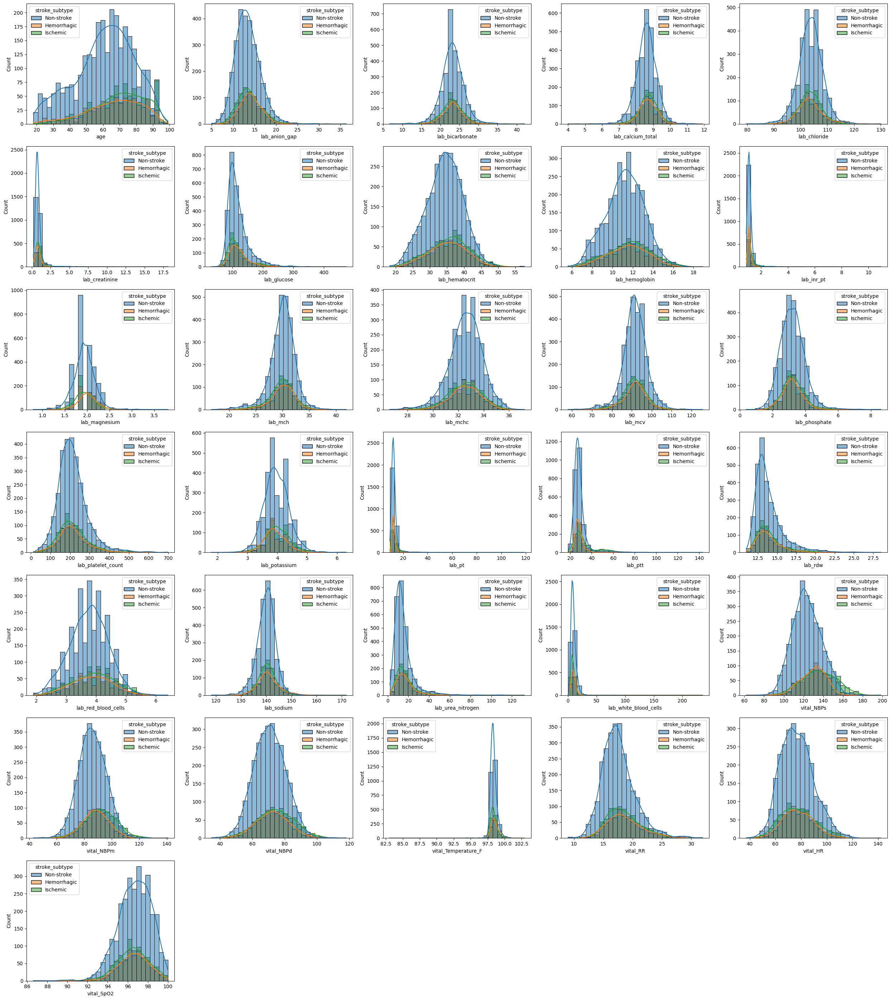

In [ ]:
# Numerical features include age, lab tests and vital signs
num_cols = ['age'] + [x for x in final_df.columns if x.startswith(tuple(['lab_', 'vital_']))]

# Histogram before removing outliers
hist_plots(num_cols, final_df, cols_per_row=5, bins=30)

In [ ]:
# Removing Outliers outside 3 standard deviations from the mean
# for skewed features visually
removed_rows_list = []
skewed_cols = ['lab_creatinine']#, 'lab_inr_pt', 'lab_pt', 'lab_ptt',
               #'lab_urea_nitrogen', 'lab_white_blood_cells', 'vital_Temperature_F']

for col in skewed_cols:
  mean = final_df[col].mean()
  std = final_df[col].std()
  col_df = final_df[[col]]
  col_df['absolute z-score'] = abs((col_df[col] - mean)/std)
  indices = col_df[col_df['absolute z-score'] > 3].index.tolist()
  for x in indices:
    if x not in removed_rows_list:
      removed_rows_list.append(x)

In [ ]:
final_df.loc[removed_rows_list,skewed_cols].agg(['max','min'])

,lab_creatinine
max,18.1
min,3.4


In [ ]:
stat, p_value = stats.shapiro(final_df[~final_df['lab_creatinine'].isnull()]['lab_creatinine'])
p_value

2.2869516038014776e-80

In [ ]:
final_df.drop(removed_rows_list, axis=0, inplace=True)
final_df.reset_index(drop=True, inplace=True)
final_df.shape

(4054, 103)

In [ ]:
final_df.head(10)

,gender,age,lab_anion_gap,lab_bicarbonate,lab_calcium_total,lab_chloride,lab_creatinine,lab_glucose,lab_hematocrit,lab_hemoglobin,...,stroke_subtype,neuro_commands_wiggle_toes,neuro_commands_stick_out_tongue,neuro_commands_close_eyes,neuro_commands_show_a_thumb_up,neuro_commands_show_2_fingers,neuro_right_facial_droop,neuro_left_facial_droop,neuro_aphasic,neuro_dysarthric
0,0,77,10.6,26.1,8.8,101.3,0.7,108.1,33.7,11.2,...,Non-stroke,1,0,0,0,0,0,0,0,0
1,1,33,13.0,27.0,8.4,102.0,1.0,91.0,39.7,13.1,...,Hemorrhagic,1,0,0,0,0,0,0,0,0
2,0,64,14.4,21.4,8.5,102.1,0.8,106.9,28.8,9.4,...,Non-stroke,1,0,0,0,0,0,0,0,0
3,0,60,14.0,23.6,8.9,101.9,0.5,110.9,34.4,11.4,...,Hemorrhagic,1,0,0,0,0,0,0,0,0
4,0,61,11.0,24.0,8.1,108.0,0.6,93.0,32.0,10.4,...,Non-stroke,0,1,0,0,0,0,0,0,0
5,0,83,16.8,21.6,8.5,102.0,0.6,128.8,26.2,8.7,...,Non-stroke,1,0,0,0,0,0,0,0,0
6,1,20,17.0,24.0,9.1,101.0,0.8,94.0,40.7,14.1,...,Non-stroke,0,1,0,0,0,0,0,0,0
7,0,63,14.8,21.0,8.3,106.2,0.5,110.7,36.9,11.6,...,Hemorrhagic,1,0,0,0,0,0,0,0,0
8,0,64,12.0,26.0,8.5,105.0,0.5,97.0,36.9,12.0,...,Non-stroke,0,1,0,0,0,0,0,0,0
9,0,90,12.7,26.0,9.4,100.0,1.0,141.7,44.1,14.3,...,Ischemic,0,1,0,0,0,0,0,0,0


### **2.1.2. Categorical variables**

In [ ]:
final_df['neuro_gcs_motor_response'] = final_df['neuro_gcs_motor_response'].apply(lambda x: 'No response' if x == 'No Response-ETT' else x)

In [ ]:
# delete columns that has only 1 value
col_list = []
for col in final_df.columns:
  if len(final_df[col].unique()) == 1:
    col_list.append(col)
final_df.drop(col_list, axis=1, inplace=True)

## **2.2. Imputing missing values with KNN**

### **Transforming features**

In [ ]:
# ----Encoding categorical features with scoring system----
# Categorical features include gender, neurological checks, symptoms, past diagnoses and comorbidity
# However, symptoms, comorbidity and past diagnoses have already been encoded

# Gender: 1 - Male, 0 - Female
final_df['gender'] = final_df['gender'].map({'F': 0, 'M': 1})

# Scoring systems
# GCS
final_df['neuro_gcs_eye_opening'] = final_df['neuro_gcs_eye_opening'].map({'No': 1, 'To Pain': 2,
                                                                           'To Speech': 3, 'Spontaneously': 4})
final_df['neuro_gcs_motor_response'] S= final_df['neuro_gcs_motor_response'].map({'No response': 1, 'Abnormal extension': 2, 'Abnormal Flexion': 3,
                                                                                 'Flex-withdraws': 4, 'Localizes Pain': 5, 'Obeys Commands': 6})
final_df['neuro_gcs_verbal_response'] = final_df['neuro_gcs_verbal_response'].map({'No Response': 1, 'No Response-ETT': 1, 'Incomprehensible sounds': 2,
                                                                                   'Inappropriate Words': 3, 'Confused': 4, 'Oriented': 5})

# Limb strength
for col in [x for x in final_df.columns if x.startswith(tuple(['neuro_strength_']))]:
  final_df[col] = final_df[col].map({'No movement': 0, 'Muscle contraction, but no movement': 1,
                                     'Movement, but not against gravity': 2, 'Lifts against gravity, no resistance': 3,
                                     'Some resistance': 4, 'Full resistance': 5})



# Self-created scoring for ordinal features
final_df['neuro_commands_response'] = final_df['neuro_commands_response'].map({'No': 0,
                                                                               'Inconsistently': 1,
                                                                               'Consistently': 2})

for col in [x for x in final_df.columns if x.startswith(tuple(['neuro_pupil_size_']))]:
  final_df[col] = final_df[col].map({'Surgical': 0,
                                     'Pinpoint': 1,
                                     '2mm': 2,
                                     '3mm': 3,
                                     '4mm': 4,
                                     '5mm': 5,
                                     '6mm': 6,
                                     '7mm': 7,
                                     'Fully Dilated': 8})

for col in [x for x in final_df.columns if x.startswith(tuple(['neuro_pupil_response_']))]:
  final_df[col] = final_df[col].map({'Non-reactive': 0,
                                     'Sluggish': 1,
                                     'Brisk ': 2})

# Encoding for nominal feature
# commands
for col in final_df['neuro_commands'].dropna().unique().tolist():
  final_df[f'neuro_commands_{col.lower().replace(" ","_")}'] = final_df['neuro_commands'].apply(lambda x: 1 if x == col else 0)
final_df.drop('neuro_commands', axis=1, inplace=True)

# facial droop
final_df['neuro_right_facial_droop'] = final_df['neuro_facial_droop'].apply(lambda x: 1 if x == 'Right' else 0)
final_df['neuro_left_facial_droop'] = final_df['neuro_facial_droop'].apply(lambda x: 1 if x == 'Left' else 0)
final_df.drop('neuro_facial_droop', axis=1, inplace=True)

# speech, only choose aphasic and dysarthric
final_df['neuro_aphasic'] = final_df['neuro_speech'].apply(lambda x: 1 if x == 'Aphasic' else 0)
final_df['neuro_dysarthric'] = final_df['neuro_speech'].apply(lambda x: 1 if x == 'Dysarthric' else 0)
final_df.drop('neuro_speech', axis=1, inplace=True)

In [ ]:
# ----Scaling numerical and ordinal features----
scaler = StandardScaler()
X = final_df.drop(['stroke', 'stroke_subtype'], axis=1)
excluded_binary = [col for col in X.columns if len(X[col].unique()) > 2]

X[excluded_binary] = scaler.fit_transform(X[excluded_binary])

### **Imputing null with KNN Imputer**

In [ ]:
imputer = KNNImputer(n_neighbors=10)

# Impute missing values
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

In [ ]:
# Reverse scaling
X_imputed[excluded_binary] = scaler.inverse_transform(X_imputed[excluded_binary])

neuro_cols = [col for col in X.columns if col.startswith('neuro_')]
X_imputed[neuro_cols] = X_imputed[neuro_cols].round(0)

imputed_df = X_imputed
imputed_df
imputed_df['stroke'] = final_df['stroke']
imputed_df['stroke_subtype'] = final_df['stroke_subtype']

# Convert binary and ordinal features into integer
for col in ['age', 'gender'] + [x for x in imputed_df.columns if x.startswith(tuple(['past_', 'co_', 'symptom_', 'neuro_', 'sub_', 'fam_']))]:
  imputed_df[col] = imputed_df[col].astype(int)

In [ ]:
imputed_df.head(10)

,gender,age,lab_anion_gap,lab_bicarbonate,lab_calcium_total,lab_chloride,lab_creatinine,lab_glucose,lab_hematocrit,lab_hemoglobin,...,neuro_commands_stick_out_tongue,neuro_commands_close_eyes,neuro_commands_show_a_thumb_up,neuro_commands_show_2_fingers,neuro_right_facial_droop,neuro_left_facial_droop,neuro_aphasic,neuro_dysarthric,stroke,stroke_subtype
0,0,77,10.6,26.1,8.8,101.3,0.7,108.1,33.7,11.2,...,0,0,0,0,0,0,0,0,No-stroke,Non-stroke
1,1,33,13.0,27.0,8.4,102.0,1.0,91.0,39.7,13.1,...,0,0,0,0,0,0,0,0,Stroke,Hemorrhagic
2,0,64,14.4,21.4,8.5,102.1,0.8,106.9,28.8,9.4,...,0,0,0,0,0,0,0,0,No-stroke,Non-stroke
3,0,60,14.0,23.6,8.9,101.9,0.5,110.9,34.4,11.4,...,0,0,0,0,0,0,0,0,Stroke,Hemorrhagic
4,0,61,11.0,24.0,8.1,108.0,0.6,93.0,32.0,10.4,...,1,0,0,0,0,0,0,0,No-stroke,Non-stroke
5,0,83,16.8,21.6,8.5,102.0,0.6,128.8,26.2,8.7,...,0,0,0,0,0,0,0,0,No-stroke,Non-stroke
6,1,20,17.0,24.0,9.1,101.0,0.8,94.0,40.7,14.1,...,1,0,0,0,0,0,0,0,No-stroke,Non-stroke
7,0,63,14.8,21.0,8.3,106.2,0.5,110.7,36.9,11.6,...,0,0,0,0,0,0,0,0,Stroke,Hemorrhagic
8,0,64,12.0,26.0,8.5,105.0,0.5,97.0,36.9,12.0,...,1,0,0,0,0,0,0,0,No-stroke,Non-stroke
9,0,90,12.7,26.0,9.4,100.0,1.0,141.7,44.1,14.3,...,1,0,0,0,0,0,0,0,Stroke,Ischemic


In [ ]:
imputed_df.shape

(4054, 107)

In [ ]:
imputed_df.to_csv('/content/drive/MyDrive/Dissertation/Dataset/imputed_df.csv', index=False)

# **3. Exploratory Data Analysis**

In [ ]:
imputed_df = pd.read_csv('/content/drive/MyDrive/Dissertation/Dataset/imputed_df.csv')

## **3.1. Historgram**

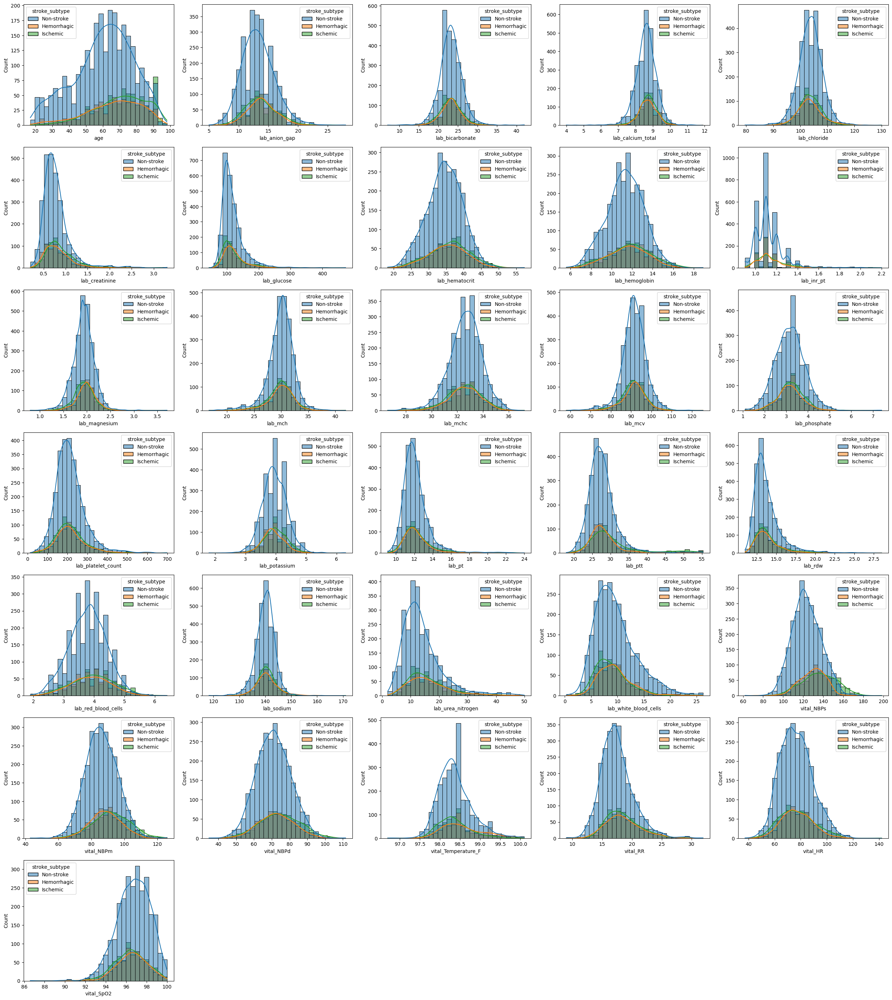

In [ ]:
# Histogram after removing outliers
hist_plots(num_cols, imputed_df, cols_per_row=5, bins=30)

## **3.2. Statistics**

### **3.2.1. Numerical**

In [ ]:
columns = pd.MultiIndex.from_tuples([
    ('Feature', ''),
    (imputed_df['stroke_subtype'].unique()[0], 'Mean'),
    (imputed_df['stroke_subtype'].unique()[0], 'STD'),
    (imputed_df['stroke_subtype'].unique()[1], 'Mean'),
    (imputed_df['stroke_subtype'].unique()[1], 'STD'),
    ('P-value', '')
])
num_stats = pd.DataFrame(columns=columns)

# Split two subsets based on stroke_subtype
for col in num_cols:
    if col in imputed_df.columns:
        # Subset 1
        subset_1 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[0])&(~imputed_df[col].isnull())][col].values
        mean_1 = np.mean(subset_1)
        std_1 = np.std(subset_1)

        # Subset 2
        subset_2 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[1])&(~imputed_df[col].isnull())][col].values
        mean_2 = np.mean(subset_2)
        std_2 = np.std(subset_2)

        # Subset 3
        subset_3 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[2])&(~imputed_df[col].isnull())][col].values
        mean_3 = np.mean(subset_3)
        std_3 = np.std(subset_3)

        # Perform t-test and add statistics into a list
        t, p_value = stats.ttest_ind(subset_1, subset_2)
        new_row = [col, round(mean_1, 1), round(std_1, 1),
                   round(mean_2, 1), round(std_2, 1),
                   round(mean_3, 1), round(std_3, 1),]

        num_stats.loc[len(num_stats)] = new_row

num_stats.to_csv('/content/drive/MyDrive/Dissertation/Result/num_stats.csv')
num_stats.sort_values('Feature')

In [ ]:
columns = pd.MultiIndex.from_tuples([
    ('Feature', ''),
    (imputed_df['stroke_subtype'].unique()[0], 'Mean'),
    (imputed_df['stroke_subtype'].unique()[0], 'STD'),
    (imputed_df['stroke_subtype'].unique()[1], 'Mean'),
    (imputed_df['stroke_subtype'].unique()[1], 'STD'),
    (imputed_df['stroke_subtype'].unique()[2], 'Mean'),
    (imputed_df['stroke_subtype'].unique()[2], 'STD')
])
num_stats = pd.DataFrame(columns=columns)

# Split two subsets based on stroke_subtype
for col in num_cols:
    if col in imputed_df.columns:
        # Subset 1
        subset_1 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[0])&(~imputed_df[col].isnull())][col].values
        mean_1 = np.mean(subset_1)
        std_1 = np.std(subset_1)

        # Subset 2
        subset_2 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[1])&(~imputed_df[col].isnull())][col].values
        mean_2 = np.mean(subset_2)
        std_2 = np.std(subset_2)

        # Subset 3
        subset_3 = imputed_df[(imputed_df['stroke_subtype'] == imputed_df['stroke_subtype'].unique()[2])&(~imputed_df[col].isnull())][col].values
        mean_3 = np.mean(subset_3)
        std_3 = np.std(subset_3)

        # Perform t-test and add statistics into a list
        t, p_value = stats.ttest_ind(subset_1, subset_2)
        new_row = [col, round(mean_1, 1), round(std_1, 1),
                   round(mean_2, 1), round(std_2, 1),
                   round(mean_3, 1), round(std_3, 1),]

        num_stats.loc[len(num_stats)] = new_row

num_stats.to_csv('/content/drive/MyDrive/Dissertation/Result/num_stats.csv')
num_stats.sort_values('Feature')

Feature Non-stroke       Hemorrhagic       Ischemic      
                                Mean   STD        Mean   STD     Mean   STD
0                     age       60.5  17.4        66.2  16.4     70.8  15.1
1           lab_anion_gap       13.3   2.7        13.9   2.4     13.7   2.7
2         lab_bicarbonate       23.2   2.8        23.2   2.5     23.2   2.7
3       lab_calcium_total        8.6   0.6         8.7   0.5      8.7   0.5
4            lab_chloride      103.7   4.3       103.6   4.7    103.6   4.1
5          lab_creatinine        0.8   0.3         0.8   0.3      0.9   0.3
6             lab_glucose      117.5  34.9       124.4  38.4    120.2  40.5
7          lab_hematocrit       34.5   5.0        35.5   5.3     36.0   5.7
8          lab_hemoglobin       11.3   1.8        11.6   1.9     11.8   2.1
9              lab_inr_pt        1.1   0.1         1.1   0.1      1.2   0.2
10          lab_magnesium        1.9   0.2         2.0   0.2      1.9   0.2
11                lab_mch       29.9   2.3        30.0   2.3     29.8   2.4
12               lab_mchc       32.6   1.2        32.6   1.2     32.5   1.3
13                lab_mcv       91.4   6.0        91.5   5.8     91.1   6.1
14          lab_phosphate        3.2   0.7         3.2   0.6      3.2   0.6
15     lab_platelet_count      213.4  74.1       214.7  75.5    216.6  76.8
16          lab_potassium        4.0   0.4         3.9   0.4      4.0   0.4
17                 lab_pt       12.2   1.5        12.3   1.5     12.6   2.0
18                lab_ptt       27.8   4.2        28.0   3.8     30.8   7.2
19                lab_rdw       13.8   1.8        13.9   1.7     14.1   2.0
20    lab_red_blood_cells        3.8   0.6         3.9   0.6      4.0   0.7
21             lab_sodium      140.0   3.6       140.8   4.3    140.5   3.8
22      lab_urea_nitrogen       14.0   7.1        16.4   7.6     16.3   7.5
23  lab_white_blood_cells        9.6   3.9         9.5   3.2      8.9   3.3
29               vital_HR       76.6  12.4        77.3  11.6     77.1  13.4
26             vital_NBPd       71.0   9.6        72.5   9.9     74.6  11.3
25             vital_NBPm       86.1   9.7        88.6   9.3     92.1  11.2
24             vital_NBPs      123.4  14.4       129.5  12.7    136.3  17.1
28               vital_RR       17.5   2.7        18.5   2.9     18.6   2.9
30             vital_SpO2       96.7   1.6        96.6   1.5     96.4   1.6
27    vital_Temperature_F       98.4   0.4        98.6   0.5     98.4   0.4

### **3.2.2. Categorical**

In [ ]:
cat_cols = ['gender'] + [x for x in imputed_df.columns if x.startswith(tuple(['sub_', 'fam_', 'past_', 'co_', 'neuro_', 'symptom_']))]

results = []

for col in cat_cols:
    if col in imputed_df.columns:
        # Create a contingency table
        contingency_table = pd.crosstab(imputed_df[col], imputed_df['stroke_subtype'])
        contingency_table = contingency_table.round(0)

        # Perform Chi-squared test
        chi2_stat, p_val, dof, expected = stats.chi2_contingency(contingency_table)

        # Calculate percentages (normalized by columns) and round to 1 decimal place
        contingency_table_percent = pd.crosstab(imputed_df[col], imputed_df['stroke_subtype'], normalize='columns') * 100
        contingency_table_percent = contingency_table_percent.round(1)

        # Ensure that contingency_table_percent has the same column names as contingency_table
        contingency_table_percent.columns = contingency_table.columns

        # Combine counts and percentages into a DataFrame with a MultiIndex for columns
        combined_table = pd.concat([contingency_table, contingency_table_percent], axis=1, keys=['Count', 'Percent'])

        # Reshape the combined_table to have the desired MultiIndex
        combined_table = combined_table.stack(level=0).unstack(level=-1)

        # Add the p-value to every row in a new column (repeated for each row of the feature)
        combined_table['P-value'] = round(p_val, 3)

        # Set MultiIndex for the rows, where the first level is the feature and the second level is the value
        combined_table.index = pd.MultiIndex.from_product([[col], combined_table.index], names=['Feature', 'Value'])

        # Append the combined table to the results list
        results.append(combined_table)

# Concatenate all results into a single DataFrame
chi2_df = pd.concat(results)

# Sort by Feature and Value
pd.set_option('display.max_rows', None)
chi2_df.to_csv('/content/drive/MyDrive/Dissertation/Result/cat_stats.csv')
chi2_df.sort_values(['Feature', 'Value'])

stroke_subtype                         Hemorrhagic         Ischemic          \
                                             Count Percent    Count Percent   
Feature                          Value                                        
co_amyloid_angiopathy            0           544.0    85.3    731.0    99.3   
                                 1            94.0    14.7      5.0     0.7   
co_angina                        0           638.0   100.0    735.0    99.9   
                                 1             0.0     0.0      1.0     0.1   
co_aortic_mitral_disorders       0           623.0    97.6    703.0    95.5   
                                 1            15.0     2.4     33.0     4.5   
co_arter_malform                 0           636.0    99.7    736.0   100.0   
                                 1             2.0     0.3      0.0     0.0   
co_atrial_fibrillation           0           524.0    82.1    505.0    68.6   
                                 1           114.0    17.9    231.0    31.4   
co_cardiac_failure               0           586.0    91.8    621.0    84.4   
                                 1            52.0     8.2    115.0    15.6   
co_cardiomegaly                  0           635.0    99.5    735.0    99.9   
                                 1             3.0     0.5      1.0     0.1   
co_cardiomyopathy                0           634.0    99.4    714.0    97.0   
                                 1             4.0     0.6     22.0     3.0   
co_diabetes                      0           525.0    82.3    518.0    70.4   
                                 1           113.0    17.7    218.0    29.6   
co_hyperlipidemia                0           395.0    61.9    347.0    47.1   
                                 1           243.0    38.1    389.0    52.9   
co_hypertension                  0           235.0    36.8    306.0    41.6   
                                 1           403.0    63.2    430.0    58.4   
co_infective_endocarditis        0           633.0    99.2    733.0    99.6   
                                 1             5.0     0.8      3.0     0.4   
co_intermittent_claudication     0           638.0   100.0    735.0    99.9   
                                 1             0.0     0.0      1.0     0.1   
co_moyamoya                      0           632.0    99.1    733.0    99.6   
                                 1             6.0     0.9      3.0     0.4   
co_myocardial_infarct            0           625.0    98.0    699.0    95.0   
                                 1            13.0     2.0     37.0     5.0   
co_peripheral_vascular_disease   0           633.0    99.2    717.0    97.4   
                                 1             5.0     0.8     19.0     2.6   
co_transient_ischemia_attack     0           638.0   100.0    728.0    98.9   
                                 1             0.0     0.0      8.0     1.1   
fam_diabetes                     0           638.0   100.0    730.0    99.2   
                                 1             0.0     0.0      6.0     0.8   
fam_stroke                       0           629.0    98.6    709.0    96.3   
                                 1             9.0     1.4     27.0     3.7   
gender                           0           324.0    50.8    371.0    50.4   
                                 1           314.0    49.2    365.0    49.6   
neuro_aphasic                    0           614.0    96.2    693.0    94.2   
                                 1            24.0     3.8     43.0     5.8   
neuro_commands_close_eyes        0           635.0    99.5    731.0    99.3   
                                 1             3.0     0.5      5.0     0.7   
neuro_commands_response          0           118.0    18.5     60.0     8.2   
                                 1           214.0    33.5    228.0    31.0   
                                 2           306.0    48.0    448.0    60.9   
neuro_commands_show_2_fingers    0           638.0

# **4. Functions**

## **4.1. Model**

### **4.1.1. Logistic Regression**

In [ ]:
def search_logreg(X_train, y_train):
    # Start timer
    start_time = time.time()

    pipeline = Pipeline([
        ('scaler', StandardScaler()),  # Standardize the features
        ('logreg', LogisticRegression(random_state=11))
    ])
    lr_params = [{
        'logreg__C': [0.001, 0.01, 0.1, 1, 10],
        'logreg__solver': ['lbfgs', 'liblinear', 'saga'],
        'logreg__penalty': ['l2']
    },
    {
        'logreg__C': [0.001, 0.01, 0.1, 1, 10],
        'logreg__solver': ['liblinear', 'saga'],
        'logreg__penalty': ['l1']
        }]

    grid_lr = GridSearchCV(pipeline, lr_params, scoring='roc_auc', cv=10,
                           return_train_score=True)
    grid_lr.fit(X_train, y_train)

    chosen_columns = list(map(lambda x: 'param_' + x, list(lr_params[0].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_lr.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Logistic Regression ran in {running_time/60: .2f} minnutes')

    return cv_results

### **4.1.2. Random Forest**

In [ ]:
def search_rf(X_train, y_train):
    # Start timer
    start_time = time.time()

    rf = RandomForestClassifier(random_state=11)
    rf_params = [{
        'max_depth': range(2,6),
        'max_features': range(2,6),
        'criterion': ['gini', 'entropy']
    }]

    grid_rf = GridSearchCV(rf, rf_params, scoring='roc_auc', cv=10,
                           return_train_score=True)
    grid_rf.fit(X_train, y_train)

    chosen_columns = list(map(lambda x: 'param_' + x, list(rf_params[0].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_rf.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Random Forest ran in {running_time/60: .2f} minnutes')

    return cv_results

### **4.1.3. Gradient Boosting**

In [ ]:
def search_gb(X_train, y_train):
    # Start timer
    start_time = time.time()

    gb = GradientBoostingClassifier(random_state=11)
    gb_params = [{
        'max_depth': range(2,6),
        'max_features': range(2,6),
        'learning_rate': [0.001, 0.01, 0.1, 1, 10]
    }]

    grid_gb = GridSearchCV(gb, gb_params, scoring='roc_auc',cv=10,
                           return_train_score=True)
    grid_gb.fit(X_train, y_train)

    chosen_columns = list(map(lambda x: 'param_' + x, list(gb_params[0].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_gb.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Gradient Boosting ran in {running_time/60: .2f} minutes')

    return cv_results

### **4.1.4. XGBoost**

In [ ]:
XGBClassifier(random_state=11, )

In [ ]:
def search_xgb(X_train, y_train):
    # Start timer
    start_time = time.time()

    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)

    xgb = XGBClassifier(random_state=11)
    xgb_params = [{
        'max_depth': range(2,6),
        'max_features': range(2,6),
        'learning_rate': [0.01, 0.1, 1, 10]
    }]

    grid_xgb = GridSearchCV(xgb, xgb_params, scoring='roc_auc',cv=10,
                           return_train_score=True)
    grid_xgb.fit(X_train, y_train_encoded)

    chosen_columns = list(map(lambda x: 'param_' + x, list(xgb_params[0].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_xgb.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Extreme Gradient Boosting ran in {running_time/60: .2f} minutes')

    return cv_results

### **4.1.5. Support Vector Machine**

In [ ]:
def search_svm(X_train, y_train):
    # Start timer
    start_time = time.time()

    pipeline = Pipeline([
        ('scaler', StandardScaler()),  # Standardize the features
        ('svm', SVC(random_state=11, probability=True))
    ])
    svm_params = [{
        'svm__C': [0.001, 0.01, 0.1, 1],
        'svm__kernel': ['rbf']},
                  {
        'svm__C': [0.001, 0.01, 0.1, 1],
        'svm__kernel': ['poly'],
        'svm__degree': range(1,5)
                  }]

    grid_svm = GridSearchCV(pipeline, svm_params, scoring='roc_auc',cv=10,
                            return_train_score=True)
    grid_svm.fit(X_train, y_train)

    chosen_columns = list(map(lambda x: 'param_' + x, list(svm_params[1].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_svm.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Support Vector Machine ran in {running_time/60: .2f} minutes')

    return cv_results

### **4.1.6. Multilayer Perceptron**

In [ ]:
def search_mlp(X_train, y_train):
    # Start timer
    start_time = time.time()

    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('mlp', MLPClassifier(random_state=11))
    ])
    mlp_params = [{
        'mlp__hidden_layer_sizes': [(x, y) for x in range(3, 8, 3) for y in range(1,4)],
        'mlp__activation': ['relu', 'logistic', 'tanh'],
        'mlp__learning_rate_init': [0.001, 0.01, 0.1]
    }]

    grid_mlp = GridSearchCV(pipeline, mlp_params, scoring='roc_auc',cv=10,
                            return_train_score=True)
    grid_mlp.fit(X_train, y_train)

    chosen_columns = list(map(lambda x: 'param_' + x, list(mlp_params[0].keys())))
    chosen_columns += ['mean_train_score', 'mean_test_score']

    cv_results = pd.DataFrame(grid_mlp.cv_results_)[chosen_columns].sort_values('mean_test_score', ascending=False)
    cv_results['diff (%)'] = (1 - cv_results['mean_test_score']/cv_results['mean_train_score'])*100

    # End timer
    end_time = time.time()
    running_time = end_time - start_time
    print(f'Multilayer Perceptron ran in {running_time/60: .2f} minutes')

    return cv_results

### **4.1.7. No Tune Model Pipeline**

In [ ]:
def no_tune(df, target='stroke'):
    # Data Splitting
    X = df.drop(target, axis=1)
    y = df[target].copy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
                                                        stratify=y, random_state=11)

    X_train_notres, y_train_notres = X_train, y_train

    # Hanlding imbalance with SMOTE only with stroke diagnosis
    if target == 'stroke':
        smote = SMOTE(random_state=11)
        X_train, y_train = smote.fit_resample(X_train, y_train)

    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)

    lr_model = LogisticRegression(random_state=11).fit(X_train, y_train)
    rf_model = RandomForestClassifier(random_state=11).fit(X_train, y_train)
    gb_model = GradientBoostingClassifier(random_state=11).fit(X_train, y_train)
    xgb_model = XGBClassifier(random_state=11).fit(X_train, y_train_encoded)
    svm_model = SVC(random_state=11, probability=True).fit(X_train, y_train)
    mlp_model = MLPClassifier(random_state=11).fit(X_train, y_train)

    # Soft voting, so that AUROC can be calculated
    vote_clf = VotingClassifier(estimators=[('LogisticRegression', lr_model),
                                            ('RandomForest', rf_model),
                                            ('GradienBoosting', gb_model),
                                            ('XGBoost', xgb_model),
                                            ('SupportVectorMachine', svm_model),
                                            ('MultilayerPerceptron', mlp_model)],
                                voting='soft')
    vote_clf.fit(X_train, y_train)

    # Store model object to a dictionary to use afterward
    model_dict = {'Logistic Regression': lr_model,
                  'Random Forest': rf_model,
                  'Gradient Boosting': gb_model,
                  'Extreme Gradient Boosting': xgb_model,
                  'Support Vector Machine': svm_model,
                  'Multilayer Perceptron': mlp_model,
                  'Soft Voting': vote_clf}

    return model_dict, X_train_notres, y_train_notres, X_test, y_test

## **4.2. Metrics**

### **4.2.1. AUROC, Accuracy, Precision, Recall, F1**

In [ ]:
def model_performance(model_dict, X_test, y_test, pos_labels=['Stroke', 1]):
    # Create a performance dataframe
    performance_df = pd.DataFrame(columns=['Model', 'AUROC', 'Accuracy',
                                           'Precision', 'Recall', 'F1'])

    le = LabelEncoder()
    y_test_encoded = le.fit_transform(y_test)
    # For loop through all model from model dictionary
    for name, model in model_dict.items():
        if name == 'Extreme Gradient Boosting':
            y_true = y_test_encoded
            pos_label = pos_labels[1]
        else:
            y_true = y_test
            pos_label = pos_labels[0]

        y_pred_prob = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

        auc = round(roc_auc_score(y_true, y_pred_prob), 2)
        accuracy = round(accuracy_score(y_true, y_pred), 2)

        # Precision, reall and f1 need to state positive label
        precision = round(precision_score(y_true, y_pred, pos_label=pos_label), 2)
        recall = round(recall_score(y_true, y_pred, pos_label=pos_label), 2)
        f1 = round(f1_score(y_true, y_pred, pos_label=pos_label), 2)

        # Create a list to add to the performance dataframe
        # the order must be exactly the same as the columns
        performace_list = [name, auc, accuracy, precision, recall, f1]

        # Add new row to performance dataframe
        performance_df.loc[len(performance_df)] = performace_list

    performance_df.set_index('Model', inplace=True)

    return performance_df

### **4.2.2. Confidence interval using Bootstrapping**

In [ ]:
def bootstrap(model_dict, X_test, y_test, n_bootstraps=1000,
              target='stroke', pos_labels=['Stroke', 1]):
    y_test.reset_index(drop=True, inplace=True)

    np.random.seed(11)
    # Create a dataframe
    columns = pd.MultiIndex.from_tuples([
        ('Model', ''),
        ('AUROC', 'Lower'), ('AUROC', 'Upper'),
        ('Accuracy', 'Lower'), ('Accuracy', 'Upper'),
        ('Precision', 'Lower'), ('Precision', 'Upper'),
        ('Recall', 'Lower'), ('Recall', 'Upper'),
        ('F1', 'Lower'), ('F1', 'Upper')
    ])
    ci_df = pd.DataFrame(columns=columns)

    # For loop through all model
    for name, model in model_dict.items():
        y_pred_prob = model.predict_proba(X_test)[:, 1]
        y_pred = model.predict(X_test)

        le = LabelEncoder()
        y_test_encoded = le.fit_transform(y_test)

        aucs, accuracies, precisions, recalls, f1s = [], [], [], [], []
        # Perform bootstrap sampling
        if name == 'Extreme Gradient Boosting':
            y_true = y_test_encoded
            pos_label = pos_labels[1]
        else:
            y_true = y_test.values
            pos_label = pos_labels[0]

        for _ in range(n_bootstraps):
        # Sample with replacement from the original data
            indices = np.random.randint(0, len(y_true), len(y_true))
            if len(np.unique(y_true[indices])) < 2:
                # We need at least one positive and one negative sample for AUROC to be defined
                continue

            auc = roc_auc_score(y_true[indices], y_pred_prob[indices])
            accuracy = accuracy_score(y_true[indices], y_pred[indices])

            # Add positive label
            precision = precision_score(y_true[indices], y_pred[indices], pos_label=pos_label)
            recall = recall_score(y_true[indices], y_pred[indices], pos_label=pos_label)
            f1 = f1_score(y_true[indices], y_pred[indices], pos_label=pos_label)

            # Store metrics
            aucs.append(auc)
            accuracies.append(accuracy)
            precisions.append(precision)
            recalls.append(recall)
            f1s.append(f1)


        # Calculate 95% confidence intervals for all metrics
        metrics_dict = {
            'AUC': aucs,
            'Accuracy': accuracies,
            'Precision': precisions,
            'Recall': recalls,
            'F1': f1s
        }
        # Compute 95% CI and add to a list
        ci_list = [name]
        for metric_name, metric_values in metrics_dict.items():
            sorted_metric_values = np.sort(metric_values)
            ci_lower = round(sorted_metric_values[int(0.025 * len(sorted_metric_values))], 2)
            ci_upper = round(sorted_metric_values[int(0.975 * len(sorted_metric_values))], 2)
            ci_list.append(ci_lower)
            ci_list.append(ci_upper)

        # Add to the dataframe
        ci_df.loc[len(ci_df)] = ci_list

    return ci_df

### **4.2.3. ROC and PR Curves**

In [ ]:
def plot_roc_pr_curves(model_dict, X_test, y_test, pos_labels=['Stroke', 1]):
     # Plotting
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Colour
    colors = ['#FF0000', '#FF8000', '#80FF00', '#0080FF', '#FF66FF', '#606060', '#21130d']

    le = LabelEncoder()
    y_test_encoded = le.fit_transform(y_test)
    # For loop through each model
    for i, name in enumerate(model_dict.keys()):
        if name == 'Extreme Gradient Boosting':
            y_true = y_test_encoded
            pos_label = pos_labels[1]
        else:
            y_true = y_test
            pos_label = pos_labels[0]

        model = model_dict[name]

        # AUC curve
        y_scores = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_true, y_scores, pos_label=pos_label)
        roc_auc = auc(fpr, tpr)
        ax1.plot(fpr, tpr, color=colors[i], lw=1, label=f'{name} (AUC = {roc_auc:.2f})')

        # Precision-recall curve
        precision, recall, _ = precision_recall_curve(y_true, y_scores,
                                                      pos_label=pos_label)
        average_precision = average_precision_score(y_true, y_scores,
                                                    pos_label=pos_label)
        ax2.plot(recall, precision, color=colors[i], lw=1,
                label=f'{name} (AP = {average_precision:.2f})')

    # Add elements to AUC plot
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.0])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic Curve')
    ax1.legend(loc="lower right")

    # Add elements to Precision-Recall Curve
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.0])
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.set_title('Precision-Recall Curve')
    ax2.legend(loc="lower left")

    for ax in [ax1, ax2]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.show()

## **4.3. Model explanation**

### **4.3.1. Logistic Regression coefficients**

In [ ]:
def lr_coefficients(lr_model, top=10):
    coefficients = lr_model.named_steps['lr'].coef_[0]

    feature_importance = pd.DataFrame({'Feature': lr_model.feature_names_in_,
                                    'Coefficient': coefficients})
    feature_importance['Absolute Coefficient'] = np.abs(feature_importance['Coefficient'])
    feature_importance = feature_importance.sort_values(by='Absolute Coefficient', ascending=False)

    sns.barplot(data=feature_importance.head(top), x='Coefficient', y='Feature')
    plt.show()

### **4.3.2. Feature importances**

In [ ]:
def feature_importances(model, top=10):
    feature_importance = pd.DataFrame({'Feature': model.feature_names_in_,
                                       'Importance': model.feature_importances_})
    feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

    sns.barplot(data=feature_importance.head(top), x='Importance', y='Feature')
    plt.show()

### **4.3.3. SHapley Additive exPlanations (SHAP)**

In [ ]:
def shap_tree_explainer(tree_model, X, top=10):
    explainer = shap.TreeExplainer(tree_model)
    shap_values = explainer.shap_values(X)

    shap.summary_plot(shap_values, X, max_display=top)
    plt.show()

In [ ]:
def shap_mean(tree_model, X, top=10):
    explainer = shap.TreeExplainer(tree_model)
    shap_values = explainer.shap_values(X)

    shap.plots.bar(shap_values)
    plt.show()

In [ ]:
def shap_instance_explainer(model, X, th_instance=0):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X.iloc[[th_instance]])

    shap.waterfall_plot(shap_values[0])
    plt.show()

### **4.3.4. Local Interpretable Model-agnostic Explanations (LIME)**

In [ ]:
def lime_explainer(model, X, y, th_instance=0, num_features=10):
    explainer = lime.lime_tabular.LimeTabularExplainer(X.values, feature_names=X.columns.values.tolist(),
                                                      class_names=y.unique(), verbose=True, mode='classification')
    exp = explainer.explain_instance(X.values[th_instance], model.predict_proba, num_features=num_features)
    print(f'Actual outcome: {y[th_instance]}')

    exp.show_in_notebook(show_table=True)

    return exp.as_list()

# **5. Model Implementation**

In [ ]:
imputed_df = pd.read_csv('/content/drive/MyDrive/Dissertation/Dataset/imputed_df.csv')

In [ ]:
model_names = ['Logistic Regression', 'Random Forest', 'Gradient Boosting', 'Extreme Gradient Boosting',
              'Support Vector Machine', 'Multilayer Perceptron', 'Soft Voting']

In [ ]:
imputed_df.shape

(4054, 107)

## **5.1. Stroke case detection**

In [ ]:
detection_df = imputed_df.drop('stroke_subtype', axis=1)
detection_df['stroke'].value_counts()

,count
stroke,
No-stroke,2680
Stroke,1374


### **5.1.1. Model training**

#### **a. No tune**

In [ ]:
detect_no_tune, X_train_detect, y_train_detect, X_test_detect, y_test_detect = no_tune(detection_df, target='stroke')

In [ ]:
model_performance(detect_no_tune, X_train_detect, y_train_detect, pos_labels=['Stroke', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.77,0.71,0.56,0.66,0.60
Random Forest,1.00,1.00,1.00,1.00,1.00
Gradient Boosting,0.91,0.83,0.76,0.75,0.76
Extreme Gradient Boosting,1.00,1.00,1.00,1.00,1.00
Support Vector Machine,0.74,0.68,0.51,0.73,0.61
Multilayer Perceptron,0.82,0.77,0.69,0.60,0.64
Soft Voting,0.98,0.93,0.90,0.88,0.89


In [ ]:
model_performance(detect_no_tune, X_test_detect, y_test_detect, pos_labels=['Stroke', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.76,0.70,0.55,0.65,0.59
Random Forest,0.78,0.73,0.62,0.56,0.59
Gradient Boosting,0.79,0.75,0.63,0.64,0.64
Extreme Gradient Boosting,0.79,0.75,0.65,0.59,0.62
Support Vector Machine,0.71,0.64,0.48,0.70,0.57
Multilayer Perceptron,0.77,0.74,0.64,0.53,0.58
Soft Voting,0.80,0.76,0.64,0.63,0.64


#### **b. Model tuning**

In [ ]:
smote = SMOTE(random_state=11)
X_train_detect_res, y_train_detect_res = smote.fit_resample(X_train_detect, y_train_detect)

In [ ]:
# Logistic Regression -> C=0.1, solver=liblinear, penalty=l1
search_logreg(X_train_detect_res, y_train_detect_res)

Logistic Regression ran in  1.78 minnutes


,param_logreg__C,param_logreg__solver,param_logreg__penalty,mean_train_score,mean_test_score,diff (%)
19,0.1,liblinear,l1,0.877754,0.856153,2.460951
20,0.1,saga,l1,0.877677,0.856079,2.460890
22,1,saga,l1,0.879467,0.853191,2.987695
21,1,liblinear,l1,0.879533,0.852864,3.032083
8,0.1,saga,l2,0.879236,0.852839,3.002238
7,0.1,liblinear,l2,0.879365,0.852833,3.017116
6,0.1,lbfgs,l2,0.879368,0.852819,3.019113
11,1,saga,l2,0.879503,0.852583,3.060834
24,10,saga,l1,0.879515,0.852574,3.063124
14,10,saga,l2,0.879515,0.852497,3.071860


In [ ]:
# Random Forest -> max_depth=4, max_features=3, criterion=entropy
search_rf(X_train_detect_res, y_train_detect_res)

Random Forest ran in  2.32 minnutes


,param_max_depth,param_max_features,param_criterion,mean_train_score,mean_test_score,diff (%)
15,5,5,gini,0.874269,0.827978,5.294815
31,5,5,entropy,0.872549,0.827844,5.123464
14,5,4,gini,0.871146,0.826129,5.167561
13,5,3,gini,0.866570,0.825907,4.692404
30,5,4,entropy,0.869065,0.824630,5.112904
29,5,3,entropy,0.866680,0.824269,4.893455
28,5,2,entropy,0.861944,0.822062,4.626971
12,5,2,gini,0.862237,0.820497,4.840873
25,4,3,entropy,0.845200,0.817630,3.261965
9,4,3,gini,0.846190,0.817593,3.379454


In [ ]:
# Gradient Boosting -> max_depth=3, max_features=5, learning_rate=0.1
search_gb(X_train_detect_res, y_train_detect_res)

Gradient Boosting ran in  5.47 minutes


,param_max_depth,param_max_features,param_learning_rate,mean_train_score,mean_test_score,diff (%)
47,5,5,0.1,0.980039,0.886927,9.500897
46,5,4,0.1,0.976570,0.881750,9.709476
45,5,3,0.1,0.970533,0.876892,9.648440
42,4,4,0.1,0.948361,0.870711,8.187835
43,4,5,0.1,0.952551,0.870227,8.642506
41,4,3,0.1,0.943514,0.869746,7.818382
44,5,2,0.1,0.957129,0.867144,9.401596
63,5,5,1,1.000000,0.864970,13.502958
40,4,2,0.1,0.929741,0.861324,7.358742
39,3,5,0.1,0.917402,0.860963,6.152130


In [ ]:
# Extreme Gradient Boosting -> max_depth=3, max_features=5, learning_rate=0.1
search_xgb(X_train_detect_res, y_train_detect_res)

Extreme Gradient Boosting ran in  5.50 minutes


,param_max_depth,param_max_features,param_learning_rate,mean_train_score,mean_test_score,diff (%)
30,5,4,0.1,0.990114,0.894450,9.661889
29,5,3,0.1,0.990114,0.894450,9.661889
28,5,2,0.1,0.990114,0.894450,9.661889
31,5,5,0.1,0.990114,0.894450,9.661889
24,4,2,0.1,0.970394,0.890022,8.282473
...,...,...,...,...,...,...
48,2,2,10,0.577850,0.563214,2.532881
55,3,5,10,0.442345,0.458769,-3.712999
53,3,3,10,0.442345,0.458769,-3.712999
52,3,2,10,0.442345,0.458769,-3.712999


In [ ]:
# Support Vector Machine -> C=1, kernel=poly, degree=1
search_svm(X_train_detect_res, y_train_detect_res)

Support Vector Machine ran in  20.23 minutes


,param_svm__C,param_svm__kernel,param_svm__degree,mean_train_score,mean_test_score,diff (%)
3,1,rbf,NaN,0.958066,0.882680,7.868588
16,1,poly,1,0.874541,0.850373,2.763525
2,0.1,rbf,NaN,0.872128,0.842124,3.440376
12,0.1,poly,1,0.858692,0.840289,2.143111
18,1,poly,3,0.964444,0.836472,13.269045
17,1,poly,2,0.951427,0.833539,12.390678
8,0.01,poly,1,0.821718,0.809250,1.517260
14,0.1,poly,3,0.899920,0.801510,10.935385
0,0.001,rbf,NaN,0.826671,0.800580,3.156073
1,0.01,rbf,NaN,0.826725,0.800484,3.174177


In [ ]:
# Multilayer Perceptron -> hidden_layer_sizes=(6,2), activation='logistic', learning_rate_init=0.001
search_mlp(X_train_detect_res, y_train_detect_res)

Multilayer Perceptron ran in  17.64 minutes


,param_mlp__hidden_layer_sizes,param_mlp__activation,param_mlp__learning_rate_init,mean_train_score,mean_test_score,diff (%)
30,"(6, 2)",logistic,0.001,0.894920,0.850435,4.970816
6,"(3, 3)",relu,0.001,0.910131,0.849974,6.609622
24,"(3, 3)",logistic,0.001,0.897561,0.847266,5.603457
21,"(3, 2)",logistic,0.001,0.891328,0.847096,4.962467
33,"(6, 3)",logistic,0.001,0.886596,0.844803,4.713845
3,"(3, 2)",relu,0.001,0.906048,0.843385,6.916107
8,"(3, 3)",relu,0.1,0.910473,0.842074,7.512512
27,"(6, 1)",logistic,0.001,0.876926,0.841632,4.024750
7,"(3, 3)",relu,0.01,0.915735,0.839795,8.292730
45,"(6, 1)",tanh,0.001,0.924502,0.839487,9.195799


In [ ]:
# Chosen hyperparameters
lr_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('lr', LogisticRegression(C=0.1, solver='liblinear', penalty='l1', random_state=11))
])
rf_model = RandomForestClassifier(max_depth=4, max_features=3, criterion='entropy',
                                  random_state=11)
gb_model = GradientBoostingClassifier(max_depth=3, max_features=5, learning_rate=0.1,
                                      random_state=11)
xgb_model = XGBClassifier(max_depth=3, max_features=5, learning_rate=0.1,
                          random_state=11)
svm_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('svm', SVC(C=1, kernel='poly', degree=1, random_state=11, probability=True))
])
mlp_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('mlp', MLPClassifier(hidden_layer_sizes=(6,2), activation='logistic',
                          learning_rate_init=0.001, random_state=11))
])
vote_clf = VotingClassifier(estimators=[('LogisticRegression', lr_model),
                                        ('RandomForest', rf_model),
                                        ('GradienBoosting', gb_model),
                                        ('XGBoost', xgb_model),
                                        ('SupportVectorMachine', svm_model),
                                        ('MultilayerPerceptron', mlp_model)],
                            voting='soft')


detect_models_dict = {
    'Logistic Regression': lr_model,
    'Random Forest': rf_model,
    'Gradient Boosting': gb_model,
    'Extreme Gradient Boosting': xgb_model,
    'Support Vector Machine': svm_model,
    'Multilayer Perceptron': mlp_model,
    'Soft Voting': vote_clf
}

for name, model in detect_models_dict.items():
  model.fit(X_train_detect_res, y_train_detect_res)
  joblib.dump(model, f'/content/drive/MyDrive/Dissertation/Model/Stroke case detection/{name}.pkl')

X_test_detect.to_csv('/content/drive/MyDrive/Dissertation/Model/Stroke case detection/X_test_detect.csv', index=False)
y_test_detect.to_csv('/content/drive/MyDrive/Dissertation/Model/Stroke case detection/y_test_detect.csv', index=False)

In [ ]:
le = LabelEncoder()
xgb_model = XGBClassifier(max_depth=3, max_features=5, learning_rate=0.1,
                          random_state=11).fit(X_train_detect_res, le.fit_transform(y_train_detect_res))
joblib.dump(xgb_model, '/content/drive/MyDrive/Dissertation/Model/Stroke case detection/Extreme Gradient Boosting.pkl')

['/content/drive/MyDrive/Dissertation/Model/Stroke case detection/Extreme Gradient Boosting.pkl']

### **5.1.2. Performance evaluation**

In [ ]:
detect_models_dict = {}

for name in model_names:
    detect_models_dict[name] = joblib.load(f'/content/drive/MyDrive/Dissertation/Model/Stroke case detection/{name}.pkl')

X_test_detect = pd.read_csv('/content/drive/MyDrive/Dissertation/Model/Stroke case detection/X_test_detect.csv')
y_test_detect = pd.read_csv('/content/drive/MyDrive/Dissertation/Model/Stroke case detection/y_test_detect.csv')

ModuleNotFoundError: No module named 'sklearn.ensemble._gb_losses'

In [ ]:
y_test_detect.shape

(1217, 1)

In [ ]:
model_performance(detect_models_dict, X_test_detect, y_test_detect, pos_labels=['Stroke', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.79,0.75,0.63,0.63,0.63
Random Forest,0.73,0.69,0.54,0.60,0.57
Gradient Boosting,0.76,0.72,0.58,0.63,0.60
Extreme Gradient Boosting,0.79,0.76,0.65,0.65,0.65
Support Vector Machine,0.78,0.73,0.60,0.61,0.60
Multilayer Perceptron,0.78,0.72,0.58,0.65,0.62
Soft Voting,0.79,0.74,0.62,0.63,0.62


In [ ]:
bootstrap(detect_models_dict, X_test_detect, y_test_detect, n_bootstraps=1000,
          target='stroke', pos_labels=['Stroke', 1])

Model AUROC       Accuracy       Precision        \
                             Lower Upper    Lower Upper     Lower Upper   
0        Logistic Regression  0.76  0.82     0.72  0.77      0.58  0.67   
1              Random Forest  0.70  0.76     0.66  0.72      0.49  0.58   
2          Gradient Boosting  0.73  0.79     0.69  0.74      0.53  0.62   
3  Extreme Gradient Boosting  0.76  0.82     0.74  0.78      0.60  0.69   
4     Support Vector Machine  0.75  0.81     0.71  0.76      0.55  0.65   
5      Multilayer Perceptron  0.75  0.80     0.70  0.75      0.54  0.63   
6                Soft Voting  0.76  0.81     0.72  0.77      0.57  0.66   

  Recall          F1        
   Lower Upper Lower Upper  
0   0.58  0.67  0.59  0.67  
1   0.56  0.65  0.53  0.61  
2   0.58  0.68  0.56  0.64  
3   0.60  0.69  0.61  0.68  
4   0.56  0.65  0.56  0.65  
5   0.60  0.70  0.58  0.65  
6   0.58  0.68  0.59  0.66

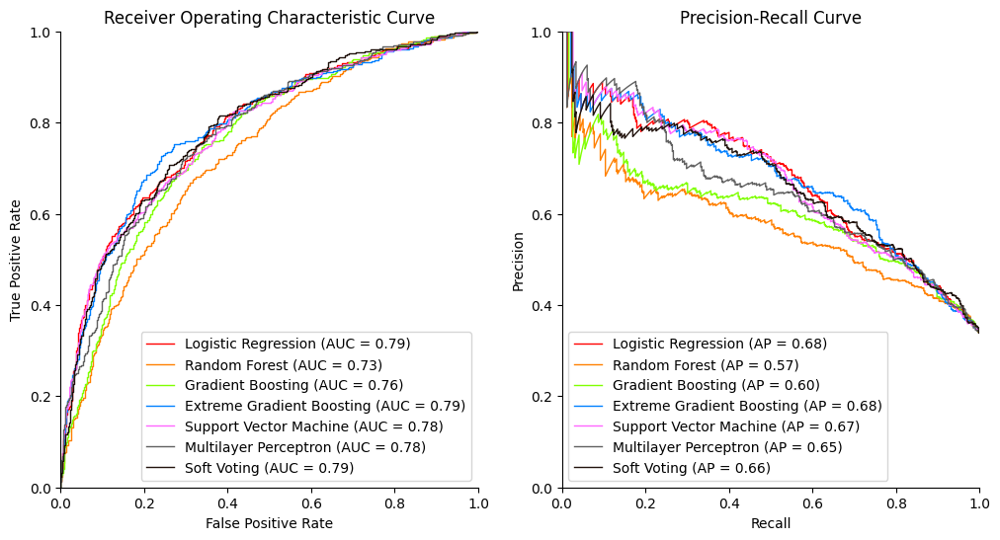

In [ ]:
plot_roc_pr_curves(detect_models_dict, X_test_detect, y_test_detect, pos_labels=['Stroke', 1])

### **5.1.3. Explanation**

#### **a. Logistic Regression coefficients**

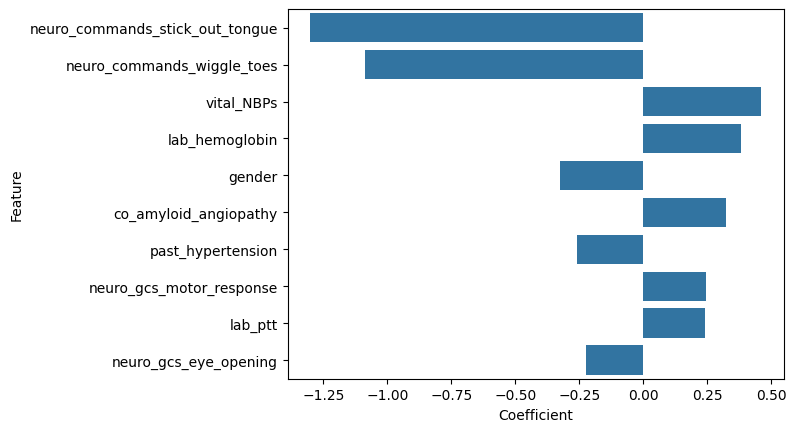

In [ ]:
detect_lr_model = detect_models_dict['Logistic Regression']

lr_coefficients(detect_lr_model, top=10)

#### **b. Feature Importance of Tree-based models**

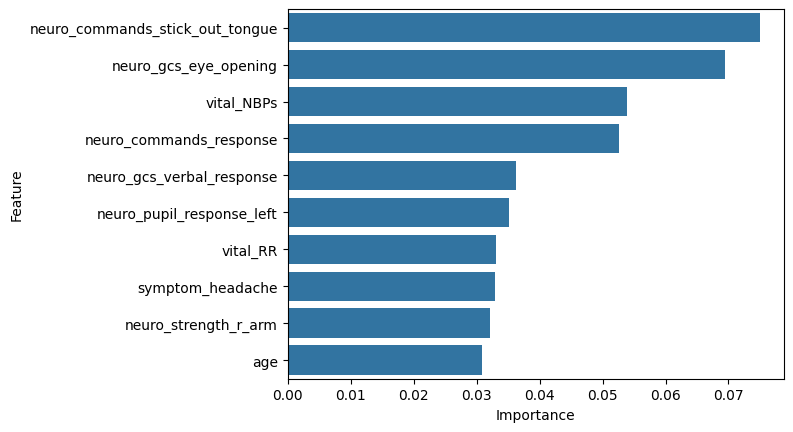

In [ ]:
detect_rf_model = detect_models_dict['Random Forest']

feature_importances(detect_rf_model, top=10)

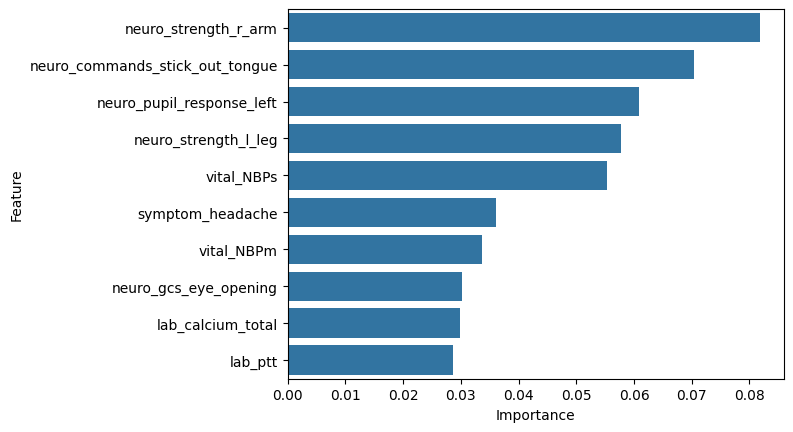

In [ ]:
detect_gb_model = detect_models_dict['Gradient Boosting']

feature_importances(detect_gb_model, top=10)

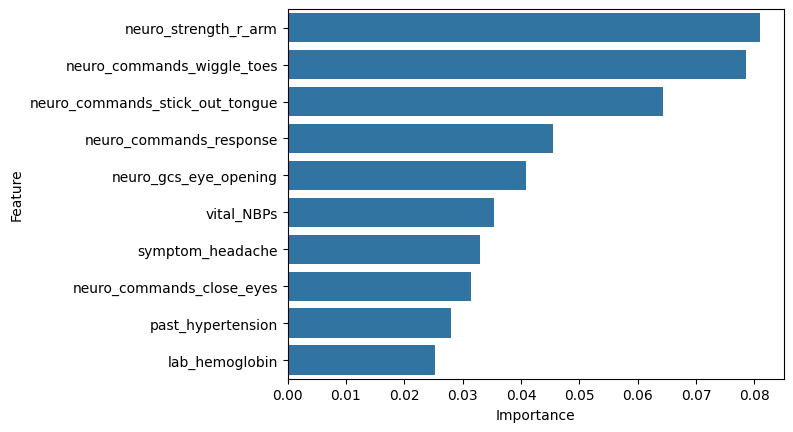

In [ ]:
detect_xgb_model = detect_models_dict['Extreme Gradient Boosting']

feature_importances(detect_xgb_model, top=10)

#### **c. SHAP**

In [ ]:
X_detect = detection_df.drop('stroke', axis=1)
y_detect = detection_df['stroke'].copy()

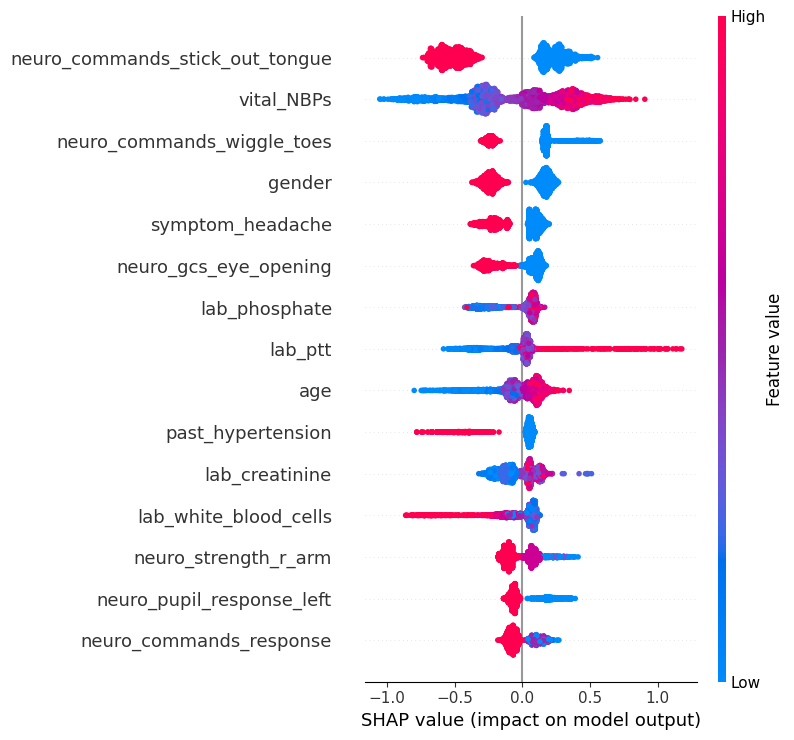

In [ ]:
shap_tree_explainer(detect_xgb_model, X_detect, top=15)

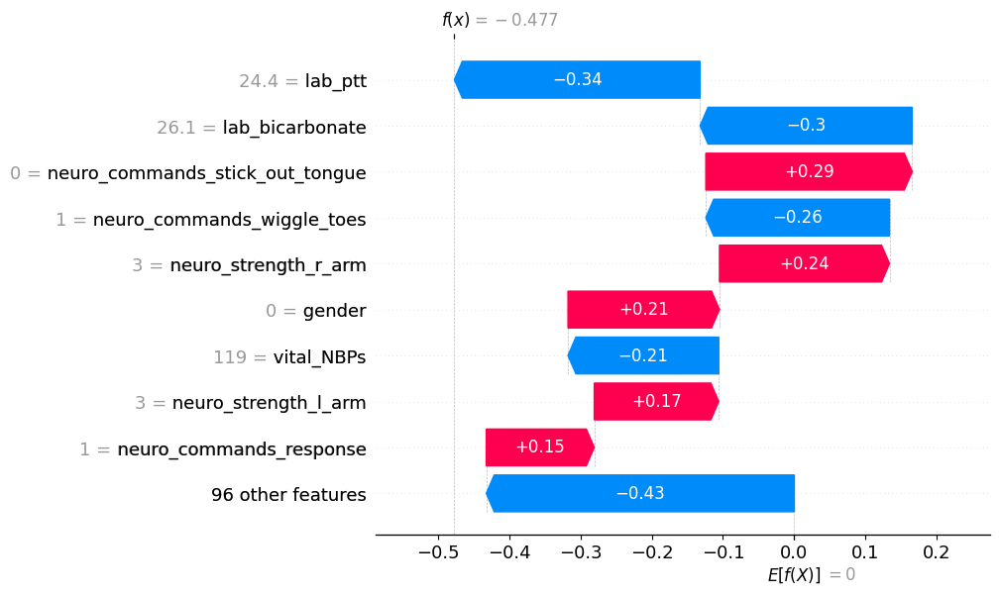

In [ ]:
shap_instance_explainer(detect_xgb_model, X_detect, th_instance=0)

#### **d. LIME**

In [ ]:
detect_xgb_model = joblib.load(f'/content/drive/MyDrive/Dissertation/Model/Stroke case detection/Extreme Gradient Boosting.pkl')

In [ ]:
detect_xgb_model.predict_proba(X_detect)[:,1]

array([0.38302866, 0.10441085, 0.5412038 , ..., 0.1161027 , 0.08272187,
       0.41495454], dtype=float32)

In [ ]:
y_true = y_detect
y_true = y_true.map({'No-stroke': 0,
                     'Stroke':1})

array([0, 1, 0, ..., 0, 0, 0])

In [ ]:
loss = y_true.values - detect_xgb_model.predict_proba(X_detect)[:,1]
loss

array([-0.38302866,  0.89558915, -0.5412038 , ..., -0.1161027 ,
       -0.08272187, -0.41495454])

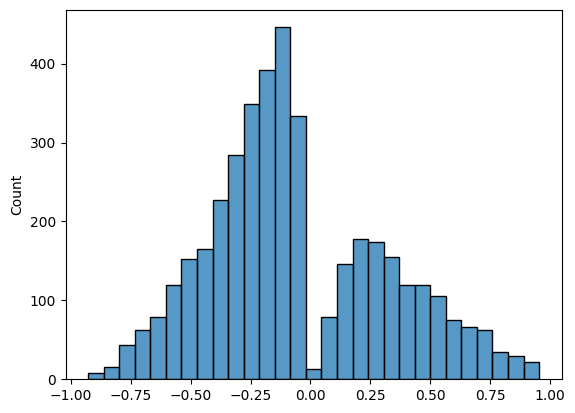

In [ ]:
sns.histplot(loss)
plt.show()

In [ ]:
np.where((loss > 0)&(loss < 0.1))

(array([ 165,  166,  243,  335,  414,  441,  697,  705,  810,  831,  882,
         917,  922,  928, 1050, 1111, 1185, 1245, 1317, 1494, 1510, 1563,
        1620, 1639, 1720, 1779, 1796, 1911, 1917, 1941, 1951, 1983, 2117,
        2171, 2227, 2236, 2248, 2293, 2397, 2438, 2465, 2485, 2513, 2594,
        2694, 2763, 2873, 2879, 2973, 3089, 3138, 3179, 3263, 3300, 3304,
        3420, 3444, 3495, 3532, 3545, 3685, 3696, 3775, 3783, 3787, 3797,
        3817, 3870, 4019]),)

In [ ]:
len(loss)

4054

In [ ]:
exp = lime_explainer(detect_xgb_model, X_detect, y_detect, th_instance=1, num_features=10)

Intercept 1.1330669699773441
Prediction_local [0.444496]
Right: 0.10441085
Actual outcome: Stroke


In [ ]:
exp = lime_explainer(detect_xgb_model, X_detect, y_detect, th_instance=43, num_features=10)

Intercept 0.8888181237832515
Prediction_local [0.55330635]
Right: 0.4840279
Actual outcome: Stroke


In [ ]:
exp = lime_explainer(detect_xgb_model, X_detect, y_detect, th_instance=16, num_features=10)

Intercept 0.9090877203579981
Prediction_local [0.63827258]
Right: 0.5559814
Actual outcome: Stroke


In [ ]:
exp = lime_explainer(detect_xgb_model, X_detect, y_detect, th_instance=165, num_features=10)

Intercept 0.5808082315402813
Prediction_local [0.71676667]
Right: 0.9169847
Actual outcome: Stroke


## **5.2. Stroke phenotyping**

In [ ]:
phenotype_df = imputed_df[imputed_df['stroke_subtype'].isin(['Ischemic', 'Hemorrhagic'])].drop('stroke', axis=1)

In [ ]:
phenotype_df['stroke_subtype'].value_counts()

,count
stroke_subtype,
Ischemic,736
Hemorrhagic,638


### **5.2.1. Model training**

#### **a. No tune**

In [ ]:
pheno_no_tune, X_train_pheno, y_train_pheno, X_test_pheno, y_test_pheno = no_tune(phenotype_df, target='stroke_subtype')

In [ ]:
model_performance(pheno_no_tune, X_train_pheno, y_train_pheno, pos_labels=['Ischemic', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.77,0.70,0.72,0.73,0.73
Random Forest,1.00,1.00,1.00,1.00,1.00
Gradient Boosting,0.99,0.94,0.93,0.95,0.94
Extreme Gradient Boosting,1.00,1.00,1.00,1.00,1.00
Support Vector Machine,0.68,0.59,0.59,0.77,0.67
Multilayer Perceptron,0.88,0.80,0.80,0.84,0.82
Soft Voting,1.00,0.97,0.97,0.98,0.98


In [ ]:
model_performance(pheno_no_tune, X_test_pheno, y_test_pheno, pos_labels=['Ischemic', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.76,0.69,0.69,0.75,0.72
Random Forest,0.86,0.78,0.78,0.82,0.80
Gradient Boosting,0.86,0.75,0.77,0.76,0.77
Extreme Gradient Boosting,0.83,0.72,0.75,0.70,0.72
Support Vector Machine,0.64,0.58,0.58,0.78,0.66
Multilayer Perceptron,0.83,0.75,0.75,0.80,0.78
Soft Voting,0.86,0.77,0.77,0.80,0.79


#### **b. Model tuning**

In [ ]:
# Logistic Regression -> C=0.01, solver='g', penalty='l2'
search_logreg(X_train_pheno, y_train_pheno)

Logistic Regression ran in  0.59 minnutes


,param_logreg__C,param_logreg__solver,param_logreg__penalty,mean_train_score,mean_test_score,diff (%)
3,0.01,lbfgs,l2,0.875231,0.828306,5.361389
5,0.01,saga,l2,0.875220,0.828219,5.370258
4,0.01,liblinear,l2,0.875312,0.827959,5.409856
7,0.1,liblinear,l2,0.887472,0.822829,7.283902
6,0.1,lbfgs,l2,0.887435,0.822828,7.280222
20,0.1,saga,l1,0.871483,0.822674,5.600694
8,0.1,saga,l2,0.887362,0.822656,7.291871
19,0.1,liblinear,l1,0.871564,0.822458,5.634319
22,1,saga,l1,0.888188,0.819219,7.765152
21,1,liblinear,l1,0.888495,0.819134,7.806567


In [ ]:
# Random Forest -> max_depth=3, max_features=4, criterion='entropy'
search_rf(X_train_pheno, y_train_pheno)

Random Forest ran in  1.28 minnutes


,param_max_depth,param_max_features,param_criterion,mean_train_score,mean_test_score,diff (%)
31,5,5,entropy,0.937257,0.818621,12.657844
15,5,5,gini,0.940748,0.816918,13.162943
30,5,4,entropy,0.936148,0.814351,13.010464
22,3,4,entropy,0.890387,0.813767,8.605181
27,4,5,entropy,0.910242,0.813405,10.638655
28,5,2,entropy,0.926702,0.813277,12.239577
11,4,5,gini,0.912552,0.812751,10.936478
10,4,4,gini,0.912636,0.812410,10.982009
6,3,4,gini,0.888789,0.812127,8.625392
14,5,4,gini,0.939185,0.811637,13.580645


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
# Gradient Boosting -> max_depth=2, max_features=4, learning_rate=0.01
search_gb(X_train_pheno, y_train_pheno)

Gradient Boosting ran in  2.38 minutes


,param_max_depth,param_max_features,param_learning_rate,mean_train_score,mean_test_score,diff (%)
45,5,3,0.1,0.998848,0.837919,16.111430
42,4,4,0.1,0.992677,0.833772,16.007651
35,2,5,0.1,0.927805,0.832855,10.233862
41,4,3,0.1,0.989930,0.829699,16.186160
39,3,5,0.1,0.970328,0.829301,14.533996
...,...,...,...,...,...,...
70,3,4,10,0.577296,0.532263,7.800711
73,4,3,10,0.579374,0.530302,8.469901
71,3,5,10,0.547994,0.529172,3.434745
78,5,4,10,0.537381,0.511420,4.831018


In [ ]:
# Extreme Gradient Boosting -> max_depth=2, max_features=4, learning_rate=0.1
search_xgb(X_train_pheno, y_train_pheno)

Extreme Gradient Boosting ran in  3.82 minutes


,param_max_depth,param_max_features,param_learning_rate,mean_train_score,mean_test_score,diff (%)
18,2,4,0.1,0.939225,0.832524,11.360537
19,2,5,0.1,0.939225,0.832524,11.360537
17,2,3,0.1,0.939225,0.832524,11.360537
16,2,2,0.1,0.939225,0.832524,11.360537
20,3,2,0.1,0.978592,0.825337,15.660688
...,...,...,...,...,...,...
48,2,2,10,0.539748,0.516203,4.362151
55,3,5,10,0.482054,0.454834,5.646586
53,3,3,10,0.482054,0.454834,5.646586
52,3,2,10,0.482054,0.454834,5.646586


In [ ]:
# Support Vector Machine -> C=0.1, kernel='poly', degree=1
search_svm(X_train_pheno, y_train_pheno)

Support Vector Machine ran in  1.24 minutes


,param_svm__C,param_svm__kernel,param_svm__degree,mean_train_score,mean_test_score,diff (%)
3,1,rbf,NaN,0.961283,0.833170,13.327268
16,1,poly,1,0.874458,0.825093,5.645259
12,0.1,poly,1,0.842821,0.813469,3.482573
18,1,poly,3,0.986051,0.796876,19.185114
8,0.01,poly,1,0.817662,0.795152,2.752895
4,0.001,poly,1,0.817526,0.795110,2.741946
2,0.1,rbf,NaN,0.847885,0.787719,7.095904
1,0.01,rbf,NaN,0.846628,0.787153,7.025007
0,0.001,rbf,NaN,0.846965,0.787112,7.066729
17,1,poly,2,0.969015,0.778516,19.659040


In [ ]:
# Multilayer Perceptron -> hidden_layer_sizes=(3,3), activation='logistic', learning_rate_init=0.001
search_mlp(X_train_pheno, y_train_pheno)

Multilayer Perceptron ran in  5.27 minutes


,param_mlp__hidden_layer_sizes,param_mlp__activation,param_mlp__learning_rate_init,mean_train_score,mean_test_score,diff (%)
24,"(3, 3)",logistic,0.001,0.876508,0.824241,5.963100
30,"(6, 2)",logistic,0.001,0.870050,0.824214,5.268170
27,"(6, 1)",logistic,0.001,0.866506,0.823854,4.922392
21,"(3, 2)",logistic,0.001,0.873094,0.823494,5.680994
18,"(3, 1)",logistic,0.001,0.868670,0.823369,5.215027
48,"(6, 2)",tanh,0.001,0.960979,0.822304,14.430656
33,"(6, 3)",logistic,0.001,0.865029,0.820154,5.187685
39,"(3, 2)",tanh,0.001,0.914961,0.819223,10.463623
23,"(3, 2)",logistic,0.1,0.897224,0.816941,8.947966
34,"(6, 3)",logistic,0.01,0.921563,0.815728,11.484338


In [ ]:
# Chosen hyperparameters
lr_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('lr', LogisticRegression(C=0.01, solver='lbfgs', penalty='l2', random_state=11))
])
rf_model = RandomForestClassifier(max_depth=3, max_features=4, criterion='entropy',
                                  random_state=11)
gb_model = GradientBoostingClassifier(max_depth=2, max_features=4, learning_rate=0.01,
                                      random_state=11)
xgb_model = XGBClassifier(max_depth=2, max_features=4, learning_rate=0.1,
                          random_state=11)
svm_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('svm', SVC(C=0.1, kernel='poly', degree=1, random_state=11, probability=True))
])
mlp_model = Pipeline([
    ('scaler', StandardScaler()),  # Standardize the features
    ('mlp', MLPClassifier(hidden_layer_sizes=(3,3), activation='logistic',
                  learning_rate_init=0.001, random_state=11))
])
vote_clf = VotingClassifier(estimators=[('LogisticRegression', lr_model),
                                        ('RandomForest', rf_model),
                                        ('GradienBoosting', gb_model),
                                        ('XGBoost', xgb_model)
                                        ('SupportVectorMachine', svm_model),
                                        ('MultilayerPerceptron', mlp_model)],
                            voting='soft')


pheno_models_dict = {
    'Logistic Regression': lr_model,
    'Random Forest': rf_model,
    'Gradient Boosting': gb_model,
    'Extreme Gradient Boosting': xgb_model,
    'Support Vector Machine': svm_model,
    'Multilayer Perceptron': mlp_model,
    'Soft Voting': vote_clf
}

for name, model in pheno_models_dict.items():
  model.fit(X_train_pheno, y_train_pheno)
  joblib.dump(model, f'/content/drive/MyDrive/Dissertation/Model/Stroke classification/{name}.pkl')

X_test_pheno.reset_index(drop=True).to_csv('/content/drive/MyDrive/Dissertation/Model/Stroke classification/X_test_pheno.csv', index=False)
y_test_pheno.reset_index(drop=True).to_csv('/content/drive/MyDrive/Dissertation/Model/Stroke classification/y_test_pheno.csv', index=False)

In [ ]:
le = LabelEncoder()
xgb_model = XGBClassifier(max_depth=2, max_features=4, learning_rate=0.1,
                          random_state=11).fit(X_train_pheno, le.fit_transform(y_train_pheno))
joblib.dump(xgb_model, '/content/drive/MyDrive/Dissertation/Model/Stroke classification/Extreme Gradient Boosting.pkl')

['/content/drive/MyDrive/Dissertation/Model/Stroke classification/Extreme Gradient Boosting.pkl']

### **5.2.2. Performance evaluation**

In [ ]:
pheno_models_dict = {}

for name in model_names:
    pheno_models_dict[name] = joblib.load(f'/content/drive/MyDrive/Dissertation/Model/Stroke classification/{name}.pkl')

X_test_pheno = pd.read_csv('/content/drive/MyDrive/Dissertation/Model/Stroke classification/X_test_pheno.csv')
y_test_pheno = pd.read_csv('/content/drive/MyDrive/Dissertation/Model/Stroke classification/y_test_pheno.csv')

#### **a. Ischemic**

In [ ]:
model_performance(pheno_models_dict, X_test_pheno, y_test_pheno, pos_labels=['Ischemic', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.84,0.76,0.75,0.83,0.79
Random Forest,0.81,0.71,0.66,0.92,0.77
Gradient Boosting,0.81,0.66,0.61,0.97,0.75
Extreme Gradient Boosting,0.86,0.76,0.77,0.77,0.77
Support Vector Machine,0.83,0.76,0.73,0.88,0.80
Multilayer Perceptron,0.82,0.75,0.75,0.80,0.77
Soft Voting,0.84,0.77,0.75,0.85,0.79


In [ ]:
bootstrap(pheno_models_dict, X_test_pheno, y_test_pheno, n_bootstraps=1000,
          target='stroke_subtype', pos_labels=['Ischemic', 1])

Model AUROC       Accuracy       Precision        \
                             Lower Upper    Lower Upper     Lower Upper   
0        Logistic Regression  0.80  0.88     0.72  0.80      0.70  0.81   
1              Random Forest  0.77  0.85     0.67  0.76      0.61  0.72   
2          Gradient Boosting  0.77  0.85     0.61  0.71      0.57  0.67   
3  Extreme Gradient Boosting  0.82  0.89     0.72  0.80      0.71  0.83   
4     Support Vector Machine  0.79  0.87     0.72  0.80      0.68  0.78   
5      Multilayer Perceptron  0.78  0.86     0.71  0.79      0.69  0.80   
6                Soft Voting  0.80  0.88     0.73  0.81      0.69  0.80   

  Recall          F1        
   Lower Upper Lower Upper  
0   0.78  0.88  0.75  0.83  
1   0.88  0.96  0.73  0.81  
2   0.94  0.99  0.71  0.79  
3   0.72  0.83  0.73  0.82  
4   0.84  0.92  0.76  0.84  
5   0.75  0.85  0.73  0.81  
6   0.80  0.89  0.75  0.83

#### **b. Haemorrhage**

In [ ]:
model_performance(pheno_models_dict, X_test_pheno, y_test_pheno, pos_labels=['Hemorrhagic', 0])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.84,0.76,0.78,0.69,0.73
Random Forest,0.81,0.71,0.84,0.46,0.60
Gradient Boosting,0.81,0.66,0.89,0.30,0.45
Extreme Gradient Boosting,0.86,0.76,0.74,0.74,0.74
Support Vector Machine,0.83,0.76,0.82,0.62,0.71
Multilayer Perceptron,0.82,0.75,0.75,0.69,0.72
Soft Voting,0.84,0.77,0.79,0.67,0.73


In [ ]:
bootstrap(pheno_models_dict, X_test_pheno, y_test_pheno, n_bootstraps=1000,
          target='stroke_subtype', pos_labels=['Hemorrhagic', 0])

Model AUROC       Accuracy       Precision        \
                             Lower Upper    Lower Upper     Lower Upper   
0        Logistic Regression  0.80  0.88     0.72  0.80      0.71  0.84   
1              Random Forest  0.77  0.85     0.67  0.76      0.77  0.90   
2          Gradient Boosting  0.77  0.85     0.61  0.71      0.81  0.96   
3  Extreme Gradient Boosting  0.82  0.89     0.72  0.80      0.68  0.80   
4     Support Vector Machine  0.79  0.87     0.72  0.80      0.76  0.88   
5      Multilayer Perceptron  0.78  0.86     0.71  0.79      0.68  0.81   
6                Soft Voting  0.80  0.88     0.73  0.81      0.73  0.85   

  Recall          F1        
   Lower Upper Lower Upper  
0   0.62  0.75  0.68  0.78  
1   0.39  0.54  0.53  0.66  
2   0.23  0.37  0.37  0.52  
3   0.68  0.80  0.69  0.79  
4   0.56  0.70  0.66  0.76  
5   0.62  0.76  0.67  0.77  
6   0.61  0.74  0.67  0.78

#### **c. AUROC and PR curves**

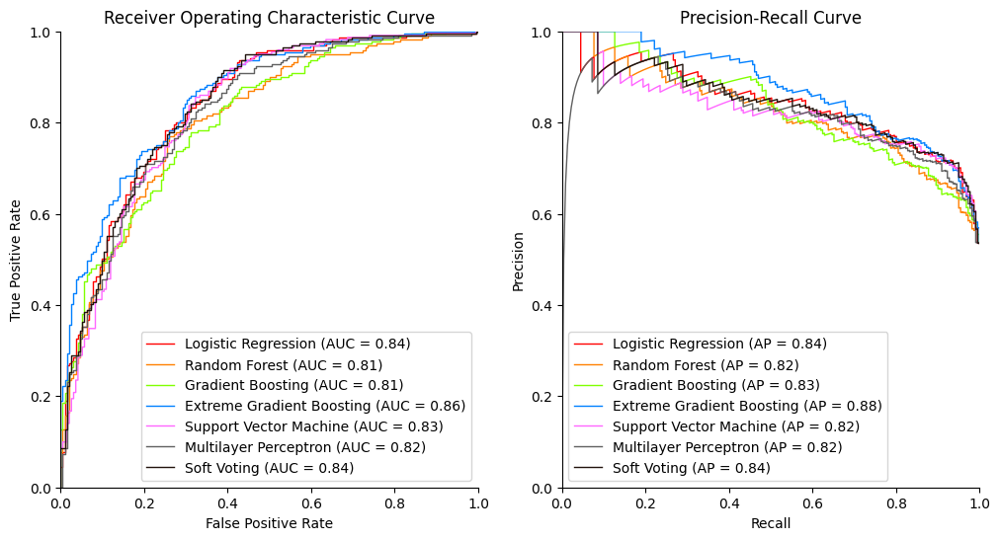

In [ ]:
plot_roc_pr_curves(pheno_models_dict, X_test_pheno, y_test_pheno, pos_labels=['Ischemic', 1])

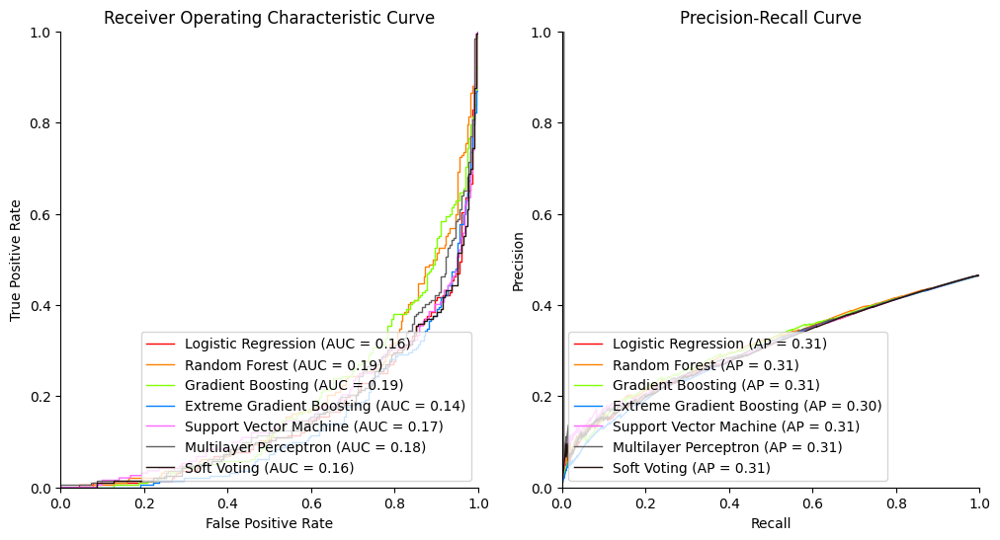

In [ ]:
plot_roc_pr_curves(pheno_models_dict, X_test_pheno, y_test_pheno, pos_labels=['Hemorrhagic', 0])

### **5.2.3. Explanation**

#### **a. Logistic Regression coefficients**

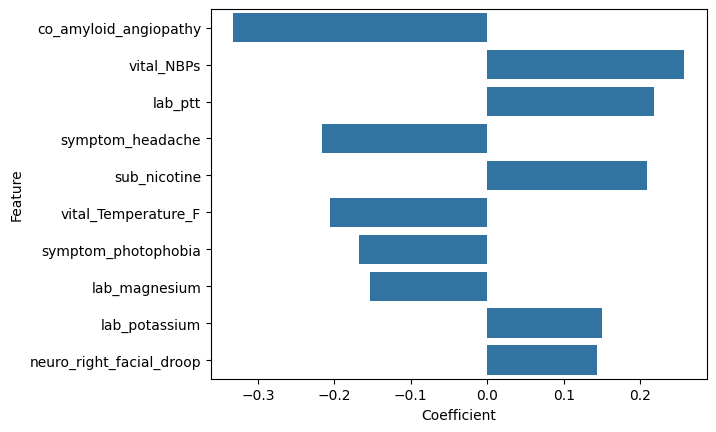

In [ ]:
pheno_lr_model = pheno_models_dict['Logistic Regression']

lr_coefficients(pheno_lr_model, top=10)

#### **b. Feature importance of Tree-based models**

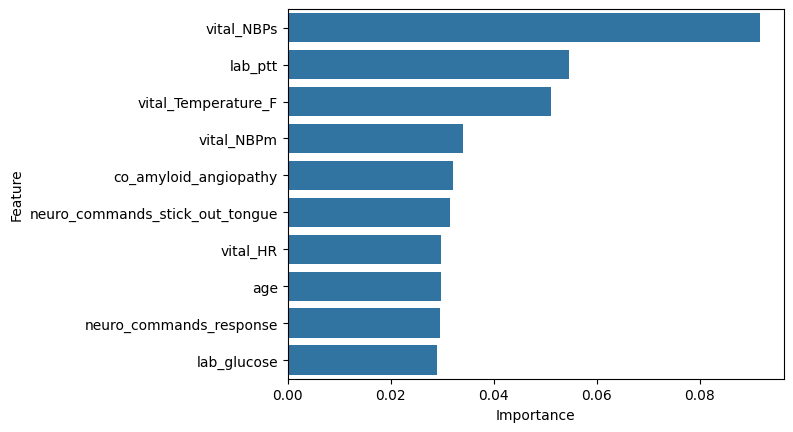

In [ ]:
pheno_rf_model = pheno_models_dict['Random Forest']

feature_importances(pheno_rf_model, top=10)

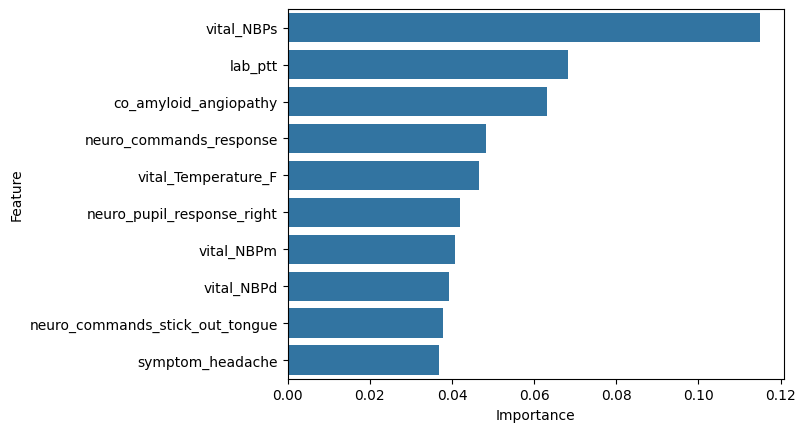

In [ ]:
pheno_gb_model = pheno_models_dict['Gradient Boosting']

feature_importances(pheno_gb_model, top=10)

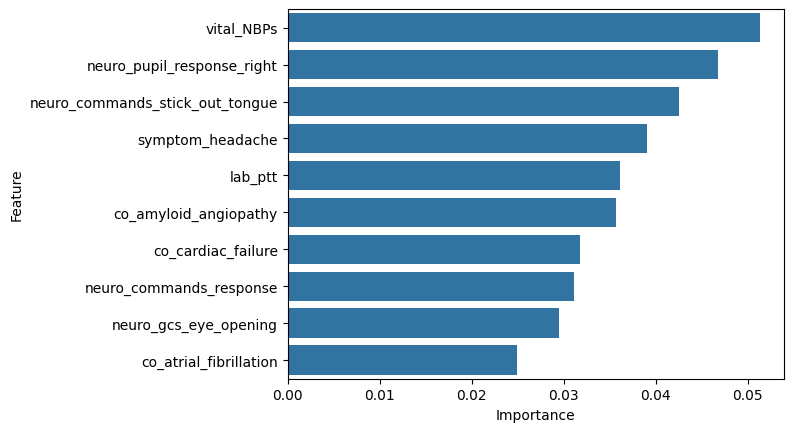

In [ ]:
pheno_xgb_model = pheno_models_dict['Extreme Gradient Boosting']

feature_importances(pheno_xgb_model, top=10)

#### **c. SHAP**

In [ ]:
X_pheno = phenotype_df.drop('stroke_subtype', axis=1)
y_pheno = phenotype_df['stroke_subtype'].copy().reset_index(drop=True)

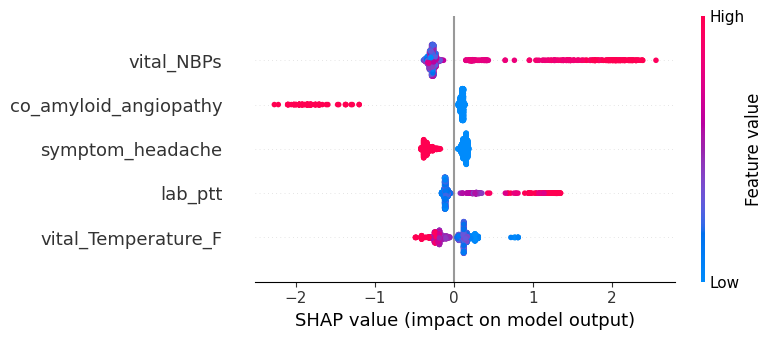

In [ ]:
shap_tree_explainer(pheno_xgb_model, X_pheno, top=5)

#### **d. LIME**

In [ ]:
pheno_xgb_model = joblib.load(f'/content/drive/MyDrive/Dissertation/Model/Stroke classification/Extreme Gradient Boosting.pkl')

In [ ]:
pheno_xgb_model.predict_proba(X_pheno)[:,1]

array([0.26799253, 0.42595893, 0.3458466 , ..., 0.9196465 , 0.5458456 ,
       0.25817028], dtype=float32)

In [ ]:
y_true = y_pheno
y_true = y_true.map({'Ischemic': 1,
                     'Hemorrhagic':0})

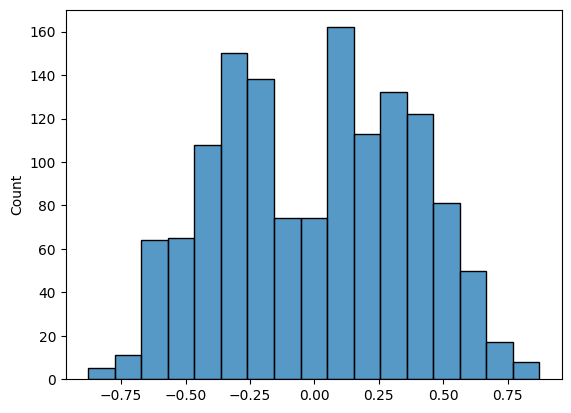

In [ ]:
loss = y_true.values - pheno_xgb_model.predict_proba(X_pheno)[:,1]
sns.histplot(loss)
plt.show()

In [ ]:
np.where((loss > 0.4) & (loss < 0.5))

(array([  19,   21,   70,   98,  119,  134,  138,  156,  173,  176,  186,
         191,  200,  237,  241,  274,  286,  300,  318,  321,  328,  355,
         356,  414,  425,  439,  455,  461,  498,  515,  517,  537,  554,
         563,  570,  585,  601,  604,  606,  609,  615,  616,  630,  647,
         656,  657,  675,  718,  721,  723,  747,  757,  769,  773,  783,
         836,  864,  866,  867,  876,  891,  904,  914,  915,  933,  958,
         977,  981,  989,  990,  995, 1054, 1061, 1067, 1092, 1095, 1100,
        1120, 1121, 1134, 1141, 1162, 1176, 1178, 1202, 1210, 1271, 1281,
        1286, 1292, 1309, 1315, 1316, 1326, 1358, 1372]),)

In [ ]:
exp = lime_explainer(pheno_xgb_model, X_pheno, y_pheno, th_instance=6, num_features=10)

Intercept 0.3550347188717952
Prediction_local [0.19276329]
Right: 0.1273879
Actual outcome: Ischemic


In [ ]:
exp = lime_explainer(pheno_xgb_model, X_pheno, y_pheno, th_instance=13, num_features=10)

Intercept -0.09382372987096399
Prediction_local [0.49968576]
Right: 0.42951024
Actual outcome: Ischemic


In [ ]:
exp = lime_explainer(pheno_xgb_model, X_pheno, y_pheno, th_instance=19, num_features=10)

Intercept 0.4484996087635816
Prediction_local [0.48745206]
Right: 0.5759794
Actual outcome: Ischemic


In [ ]:
exp = lime_explainer(pheno_xgb_model, X_pheno, y_pheno, th_instance=9, num_features=10)

Intercept 0.2733608156081148
Prediction_local [0.79224662]
Right: 0.8872056
Actual outcome: Ischemic


# **6. External validation**

## **6.1. External dataset preparation**

In [ ]:
external_df['neuro_gcs_motor_response'] = external_df['neuro_gcs_motor_response'].apply(lambda x: 'No response' if x == 'No Response-ETT' else x)

In [ ]:
# ----Encoding categorical features with scoring system----
# Categorical features include gender, neurological checks, symptoms, past diagnoses and comorbidity
# However, symptoms, comorbidity and past diagnoses have already been encoded

# Gender: 1 - Male, 0 - Female
external_df['gender'] = external_df['gender'].map({'F': 0, 'M': 1})

# Scoring systems
# GCS
external_df['neuro_gcs_eye_opening'] = external_df['neuro_gcs_eye_opening'].map({'No': 1, 'To Pain': 2,
                                                                           'To Speech': 3, 'Spontaneously': 4})
external_df['neuro_gcs_motor_response'] = external_df['neuro_gcs_motor_response'].map({'No response': 1, 'Abnormal extension': 2, 'Abnormal Flexion': 3,
                                                                                 'Flex-withdraws': 4, 'Localizes Pain': 5, 'Obeys Commands': 6})
external_df['neuro_gcs_verbal_response'] = external_df['neuro_gcs_verbal_response'].map({'No Response': 1, 'No Response-ETT': 1, 'Incomprehensible sounds': 2,
                                                                                   'Inappropriate Words': 3, 'Confused': 4, 'Oriented': 5})

# Limb strength
for col in [x for x in external_df.columns if x.startswith(tuple(['neuro_strength_']))]:
  external_df[col] = external_df[col].map({'No movement': 0, 'Muscle contraction, but no movement': 1,
                                     'Movement, but not against gravity': 2, 'Lifts against gravity, no resistance': 3,
                                     'Some resistance': 4, 'Full resistance': 5})



# Self-created scoring for ordinal features
external_df['neuro_commands_response'] = external_df['neuro_commands_response'].map({'No': 0,
                                                                               'Inconsistently': 1,
                                                                               'Consistently': 2})

for col in [x for x in external_df.columns if x.startswith(tuple(['neuro_pupil_size_']))]:
  external_df[col] = external_df[col].map({'Surgical': 0,
                                     'Pinpoint': 1,
                                     '2mm': 2,
                                     '3mm': 3,
                                     '4mm': 4,
                                     '5mm': 5,
                                     '6mm': 6,
                                     '7mm': 7,
                                     'Fully Dilated': 8})

for col in [x for x in external_df.columns if x.startswith(tuple(['neuro_pupil_response_']))]:
  external_df[col] = external_df[col].map({'Non-reactive': 0,
                                     'Sluggish': 1,
                                     'Brisk ': 2})

# Encoding for nominal feature
# commands
for col in external_df['neuro_commands'].dropna().unique().tolist():
  external_df[f'neuro_commands_{col.lower().replace(" ","_")}'] = external_df['neuro_commands'].apply(lambda x: 1 if x == col else 0)
external_df.drop('neuro_commands', axis=1, inplace=True)

# facial droop
external_df['neuro_right_facial_droop'] = external_df['neuro_facial_droop'].apply(lambda x: 1 if x == 'Right' else 0)
external_df['neuro_left_facial_droop'] = external_df['neuro_facial_droop'].apply(lambda x: 1 if x == 'Left' else 0)
external_df.drop('neuro_facial_droop', axis=1, inplace=True)

# speech, only choose aphasic and dysarthric
external_df['neuro_aphasic'] = external_df['neuro_speech'].apply(lambda x: 1 if x == 'Aphasic' else 0)
external_df['neuro_dysarthric'] = external_df['neuro_speech'].apply(lambda x: 1 if x == 'Dysarthric' else 0)
external_df.drop('neuro_speech', axis=1, inplace=True)

In [ ]:
cols = []
for col in external_df.columns:
  if col not in imputed_df.columns:
    cols.append(col)

external_df.drop(cols, axis=1, inplace=True)

In [ ]:
external_df.dropna(axis=0, inplace=True)

## **6.2. Stroke case detection**

In [ ]:
external_detection_df = external_df.drop('stroke_subtype', axis=1)
external_detection_df['stroke'].value_counts()

,count
stroke,
No-stroke,32530
Stroke,1148


In [ ]:
X_external_detect, y_external_detect = external_detection_df.drop('stroke', axis=1), external_detection_df['stroke']
columns_order = detect_models_dict['Logistic Regression'].feature_names_in_
X_external_detect = X_external_detect[columns_order]

In [ ]:
model_performance(detect_models_dict, X_external_detect, y_external_detect, pos_labels=['Stroke', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.58,0.65,0.05,0.46,0.08
Random Forest,0.65,0.56,0.05,0.66,0.09
Gradient Boosting,0.64,0.61,0.05,0.59,0.09
Extreme Gradient Boosting,0.64,0.74,0.06,0.43,0.10
Support Vector Machine,0.59,0.65,0.05,0.48,0.08
Multilayer Perceptron,0.57,0.61,0.04,0.50,0.08
Soft Voting,0.60,0.63,0.05,0.49,0.08


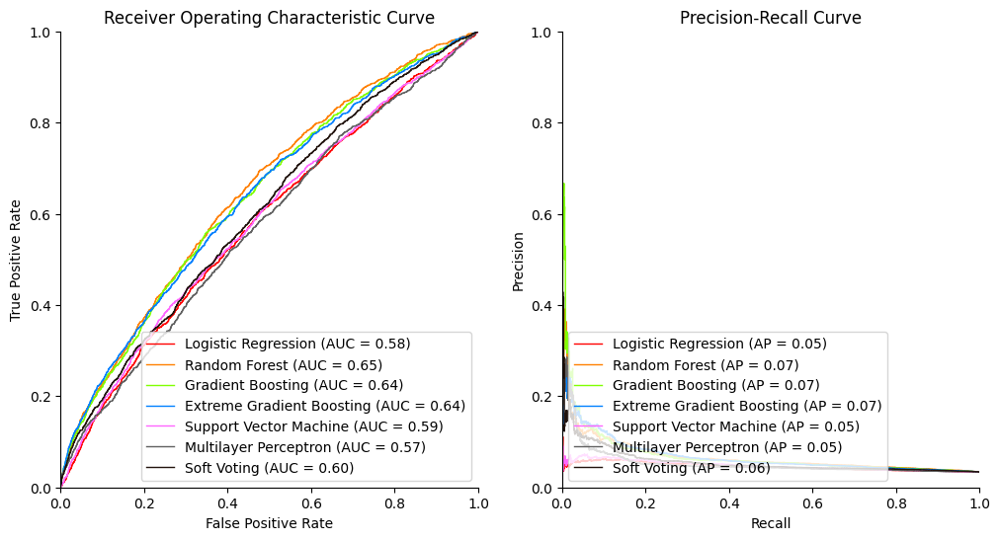

In [ ]:
plot_roc_pr_curves(detect_models_dict, X_external, y_external, pos_labels=['Stroke', 1])

## **6.3. Stroke phenotype classification**

In [ ]:
external_pheno_df = external_df.drop('stroke', axis=1)
external_pheno_df = external_pheno_df[external_pheno_df['stroke_subtype'].isin(tuple(['Ischemic', 'Hemorrhagic']))]
external_pheno_df['stroke_subtype'].value_counts()

,count
stroke_subtype,
Ischemic,882
Hemorrhagic,266


In [ ]:
X_external_pheno, y_external_pheno = external_pheno_df.drop('stroke_subtype', axis=1), external_pheno_df['stroke_subtype']
columns_order = pheno_models_dict['Logistic Regression'].feature_names_in_
X_external_pheno = X_external_pheno[columns_order]

In [ ]:
model_performance(pheno_models_dict, X_external_pheno, y_external_pheno, pos_labels=['Ischemic', 1])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.76,0.71,0.88,0.73,0.80
Random Forest,0.73,0.72,0.83,0.80,0.82
Gradient Boosting,0.66,0.71,0.81,0.81,0.81
Extreme Gradient Boosting,0.74,0.64,0.87,0.62,0.72
Support Vector Machine,0.74,0.70,0.85,0.74,0.79
Multilayer Perceptron,0.74,0.67,0.87,0.67,0.76
Soft Voting,0.75,0.70,0.88,0.71,0.78


In [ ]:
model_performance(pheno_models_dict, X_external_pheno, y_external_pheno, pos_labels=['Hemorrhagic', 0])

,AUROC,Accuracy,Precision,Recall,F1
Model,,,,,
Logistic Regression,0.76,0.71,0.42,0.67,0.52
Random Forest,0.73,0.72,0.41,0.46,0.43
Gradient Boosting,0.66,0.71,0.38,0.38,0.38
Extreme Gradient Boosting,0.74,0.64,0.36,0.70,0.47
Support Vector Machine,0.74,0.70,0.40,0.58,0.48
Multilayer Perceptron,0.74,0.67,0.38,0.67,0.49
Soft Voting,0.75,0.70,0.41,0.68,0.51


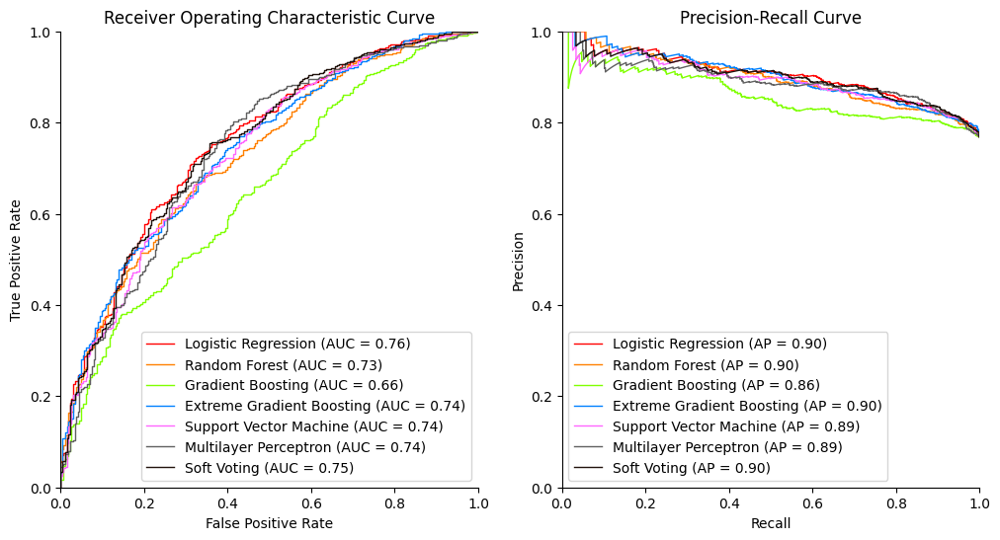

In [ ]:
plot_roc_pr_curves(pheno_models_dict, X_external_pheno, y_external_pheno, pos_labels=['Ischemic', 1])